In [1]:
import pandas as pd
import re
import numpy as np 
import seaborn as sns 
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as sp
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from scipy.stats import normaltest
from scipy import stats
from sklearn.preprocessing import  StandardScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from sklearn.model_selection import  train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor
import xgboost as xgb
import catboost
import optuna
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.pipeline import Pipeline
from scipy.special import inv_boxcox

import warnings 
warnings.filterwarnings("ignore")


# Сбор и чтение данных 

In [2]:

df = pd.read_csv('data/data.csv')

In [3]:
df.columns

Index(['status', 'private pool', 'propertyType', 'street', 'baths',
       'homeFacts', 'fireplace', 'city', 'schools', 'sqft', 'zipcode', 'beds',
       'state', 'stories', 'mls-id', 'PrivatePool', 'MlsId', 'target'],
      dtype='object')

In [4]:
df.head()

,status,private pool,propertyType,street,baths,homeFacts,fireplace,city,schools,sqft,zipcode,beds,state,stories,mls-id,PrivatePool,MlsId,target
0,Active,NaN,Single Family Home,240 Heather Ln,3.5,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",Gas Logs,Southern Pines,"[{'rating': ['4', '4', '7', 'NR', '4', '7', 'N...",2900,28387,4,NC,NaN,NaN,NaN,611019,"$418,000"
1,for sale,NaN,single-family home,12911 E Heroy Ave,3 Baths,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",NaN,Spokane Valley,"[{'rating': ['4/10', 'None/10', '4/10'], 'data...","1,947 sqft",99216,3 Beds,WA,2.0,NaN,NaN,201916904,"$310,000"
2,for sale,NaN,single-family home,2005 Westridge Rd,2 Baths,"{'atAGlanceFacts': [{'factValue': '1961', 'fac...",yes,Los Angeles,"[{'rating': ['8/10', '4/10', '8/10'], 'data': ...","3,000 sqft",90049,3 Beds,CA,1.0,NaN,yes,FR19221027,"$2,895,000"
3,for sale,NaN,single-family home,4311 Livingston Ave,8 Baths,"{'atAGlanceFacts': [{'factValue': '2006', 'fac...",yes,Dallas,"[{'rating': ['9/10', '9/10', '10/10', '9/10'],...","6,457 sqft",75205,5 Beds,TX,3.0,NaN,NaN,14191809,"$2,395,000"
4,for sale,NaN,lot/land,1524 Kiscoe St,NaN,"{'atAGlanceFacts': [{'factValue': '', 'factLab...",NaN,Palm Bay,"[{'rating': ['4/10', '5/10', '5/10'], 'data': ...",NaN,32908,NaN,FL,NaN,NaN,NaN,861745,"$5,000"


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 377185 entries, 0 to 377184
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   status        337267 non-null  object
 1   private pool  4181 non-null    object
 2   propertyType  342452 non-null  object
 3   street        377183 non-null  object
 4   baths         270847 non-null  object
 5   homeFacts     377185 non-null  object
 6   fireplace     103114 non-null  object
 7   city          377151 non-null  object
 8   schools       377185 non-null  object
 9   sqft          336608 non-null  object
 10  zipcode       377185 non-null  object
 11  beds          285903 non-null  object
 12  state         377185 non-null  object
 13  stories       226469 non-null  object
 14  mls-id        24942 non-null   object
 15  PrivatePool   40311 non-null   object
 16  MlsId         310305 non-null  object
 17  target        374704 non-null  object
dtypes: object(18)
memory usa

In [6]:
# Вычисляем список столбцов с пропусками и выводим их в процентах 
cols_null_percent = df.isnull().mean() * 100
cols_with_null = cols_null_percent[cols_null_percent>0].sort_values(ascending=False)
display(cols_with_null)

private pool    98.891525
mls-id          93.387330
PrivatePool     89.312672
fireplace       72.662221
stories         39.958111
baths           28.192532
beds            24.200856
MlsId           17.731352
sqft            10.757851
status          10.583136
propertyType     9.208479
target           0.657767
city             0.009014
street           0.000530
dtype: float64

# Очистка данных

In [7]:
# Считаем количество дубликатов 
num_duplicates = df.duplicated().sum()

print(f'Количество дубликатов в данных: {num_duplicates}')

# Удаляем дубликаты в данных 
df.drop_duplicates(inplace=True)

Количество дубликатов в данных: 50


In [8]:
# Считаем количество дубликатов 
print(df.duplicated().sum())

0


#### Поработаем с нашей целевой переменной target

In [9]:
df['target'].unique().tolist()

['$418,000',
 '$310,000',
 '$2,895,000',
 '$2,395,000',
 '$5,000',
 '$209,000',
 '181,500',
 '68,000',
 '$244,900',
 '$311,995',
 '$669,000',
 '260,000',
 '$525,000',
 '$499,900',
 '$168,800',
 '1,650,000',
 '335,000',
 '2,650,000',
 '$365,000',
 '$626,000',
 '$375,000',
 '$3,500,000',
 '579,000',
 '$499,007',
 '$182,000',
 '$3,749,000',
 '799,000',
 '$559,000',
 '$830,000',
 '$1,195,000',
 '$262,000',
 '$204,800',
 '$179,000',
 '$105,000',
 '$260,000',
 '$284,900',
 '$495,000',
 '$117,900',
 '$385,000',
 '54,000',
 '$1,100,000',
 '850,000',
 '$620,000',
 '$125,000',
 '$499,000',
 '$1,429,000',
 '$233,990+',
 '125,000',
 '$275,000',
 '$27,000',
 '$598,000',
 '$1,780,000',
 '$490,000',
 '$175,000',
 '$2,785,000',
 '$166,500',
 '$259,658',
 '$799,000',
 '$244,990',
 '$333,543',
 nan,
 '$369,900',
 '$409,069',
 '50,000',
 '$149,999',
 '$220,000',
 '$749,000',
 '$255,000',
 '$269,000',
 '$10,000',
 '$475,000',
 '219,900',
 '$1,785,000',
 '$714,550',
 '$414,900',
 '$1,795,000',
 '$339,000',

In [10]:
# Избавимся от мусора в целевом признаке target

df['target'] = df['target'].str.replace('$', '')
df['target'] = df['target'].str.replace(',', '')
df['target'] = df['target'].str.replace(' ', '')
df['target'] = df['target'].str.replace('.', '')
df['target'] = df['target'].str.replace('+', '')
df['target'] = df['target'].str.replace('/mo', '')
df['target'] = df['target'].str.replace('-', '')
df['target'] = df['target'].astype(float)

df['target'].head()

0     418000.0
1     310000.0
2    2895000.0
3    2395000.0
4       5000.0
Name: target, dtype: float64

In [11]:
# Общее количество пропусков 
df.isna().sum().sum()

1868817

In [12]:
# Вычисляем список столбцов с пропусками и выводим их в процентах 
cols_null_percent = df.isnull().mean() * 100
cols_with_null = cols_null_percent[cols_null_percent>0].sort_values(ascending=False)
display(cols_with_null)

private pool    98.891378
mls-id          93.386453
PrivatePool     89.311520
fireplace       72.659393
stories         39.952272
baths           28.188315
beds            24.196640
MlsId           17.730786
sqft            10.752118
status          10.584274
propertyType     9.209699
target           0.657589
city             0.009015
street           0.000530
dtype: float64

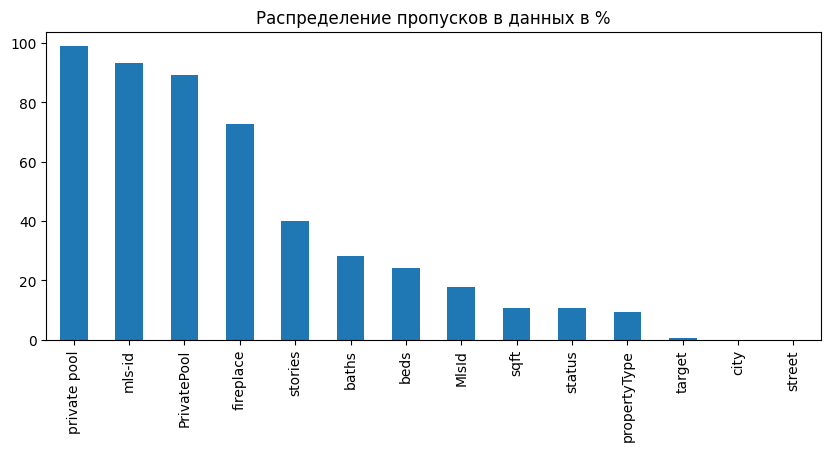

In [13]:
cols_with_null.plot(
    kind='bar',
    figsize=(10, 4),
    title='Распределение пропусков в данных в %'
);

In [14]:
# Найдём неинформативные признаки
def low_informative_feature(data):
    low_information_cols = []
    for col in data.columns:
        top_freq = data[col].value_counts(normalize=True).max()
        nunique_ratio = data[col].nunique() / data[col].count()
        if top_freq > 0.95:
            low_information_cols.append(col)
        if nunique_ratio > 0.95:
            low_information_cols.append(col)
    return low_information_cols
low_information_cols = low_informative_feature(df)
print(low_information_cols)

['private pool', 'mls-id']


In [15]:
# Удалим признаки в которых количество пропусков 45% и более

df.drop(columns=['private pool', 'PrivatePool', 'mls-id', 'fireplace'], inplace=True)

##### Для начала заполним все признаки модой кроме признака stories, так как его корректнее заполнить средним на мой взгляд, позже мы это сделаем. 

In [16]:
# Удаляем пропуски в целевой переменной
df.dropna(subset=['target'], inplace=True)

print(df['target'].isna().sum())
# Заполняем все признаки модой кроме target и stories
df[df.columns.difference(['stories'])] = df[df.columns.difference(['stories'])].apply(lambda x: x.fillna(x.mode().iloc[0]))

# Заполняем все остальные признаки модой
#df = df.fillna(df.mode().iloc[0])
# Вывод результата
print(df.isna().sum())

0
status               0
propertyType         0
street               0
baths                0
homeFacts            0
city                 0
schools              0
sqft                 0
zipcode              0
beds                 0
state                0
stories         149754
MlsId                0
target               0
dtype: int64


In [17]:
# Считаем количество строк в целевой переменной
df['target'].shape[0]

374655

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 374655 entries, 0 to 377184
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   status        374655 non-null  object 
 1   propertyType  374655 non-null  object 
 2   street        374655 non-null  object 
 3   baths         374655 non-null  object 
 4   homeFacts     374655 non-null  object 
 5   city          374655 non-null  object 
 6   schools       374655 non-null  object 
 7   sqft          374655 non-null  object 
 8   zipcode       374655 non-null  object 
 9   beds          374655 non-null  object 
 10  state         374655 non-null  object 
 11  stories       224901 non-null  object 
 12  MlsId         374655 non-null  object 
 13  target        374655 non-null  float64
dtypes: float64(1), object(13)
memory usage: 42.9+ MB


In [19]:
# удалим все выбросы для признака target
def outliers_iqr(data, feature):
    x = data[feature]
    quartile_1, quartile_3 = x.quantile(0.25), x.quantile(0.75),
    iqr = quartile_3 - quartile_1
    lower_bound = quartile_1 - (iqr * 1.5)
    upper_bound = quartile_3 + (iqr * 1.5)
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x >= lower_bound) & (x <= upper_bound)]
    return outliers, cleaned, lower_bound, upper_bound

outliers, cleaned, lower_bound, upper_bound = outliers_iqr(df, 'target')
print(f'Число выбросов по методу Тьюки: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')
print(lower_bound)
print(upper_bound)

Число выбросов по методу Тьюки: 38414
Результирующее число записей: 336241
-405525.0
1174515.0


In [20]:
# Построим график ящик с усами до и после удаления выбросов для признака 'target'
# Создаем subplot с двумя колонками
fig = sp.make_subplots(rows=1, cols=2, subplot_titles=['После очистки', 'С выбросами'], column_widths=[0.5, 0.5])

# График с выбросами
fig.add_trace(go.Box(x=df['target']), row=1, col=2)

# График после удаления выбросов
fig.add_trace(go.Box(x=cleaned['target']), row=1, col=1)

# Обновляем layout
fig.update_layout(width=1000, height=400)

# Отображение графика
fig.show()

# Сохранение графика в формат html
fig.write_html('html_plots/box_after_clean')

### Из данного графика мы видим, что после очистки выбросов цена покупки жилья стала более реальной.

In [21]:
# выведем количество строк в целевой переменной  после удаления выбросов 
df['target'].shape[0]

374655

In [22]:
# Получаем такой датасет на выходе 
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 374655 entries, 0 to 377184
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   status        374655 non-null  object 
 1   propertyType  374655 non-null  object 
 2   street        374655 non-null  object 
 3   baths         374655 non-null  object 
 4   homeFacts     374655 non-null  object 
 5   city          374655 non-null  object 
 6   schools       374655 non-null  object 
 7   sqft          374655 non-null  object 
 8   zipcode       374655 non-null  object 
 9   beds          374655 non-null  object 
 10  state         374655 non-null  object 
 11  stories       224901 non-null  object 
 12  MlsId         374655 non-null  object 
 13  target        374655 non-null  float64
dtypes: float64(1), object(13)
memory usage: 42.9+ MB


### Вывод: Данные были очищены от дубликатов, выбросов, в целевом признаке мы убрали пропущенные значения, а остальные заполнили модой 
### Эти шаги помогли создать более чистый и готовый к анализу датасет.

# Разведывательный анализ данных EDA 

In [23]:
# Выводим описательную статистику для целевой переменной 
df.describe()

,target
count,3.746550e+05
mean,6.447596e+05
std,1.841482e+06
min,1.000000e+00
25%,1.869900e+05
50%,3.200000e+05
75%,5.820000e+05
max,1.950000e+08


In [24]:
# Выводим описательную статистику для категориальных признаков
df.describe(include='object')

,status,propertyType,street,baths,homeFacts,city,schools,sqft,zipcode,beds,state,stories,MlsId
count,374655,374655,374655,374655,374655,374655,374655,374655,374655,374655,374655,224901,374655
unique,156,1279,334751,226,318850,2019,295362,25373,4541,1147,39,347,232876
top,for sale,single-family home,Address Not Disclosed,2 Baths,"{'atAGlanceFacts': [{'factValue': '', 'factLab...",Houston,"[{'rating': [], 'data': {'Distance': [], 'Grad...",0,32137,3 Beds,FL,1.0,NO MLS
freq,195310,125924,674,157419,7142,24440,4177,51948,2139,144001,114652,66805,64492


### Построим гистограмму распределения для целевого признака 

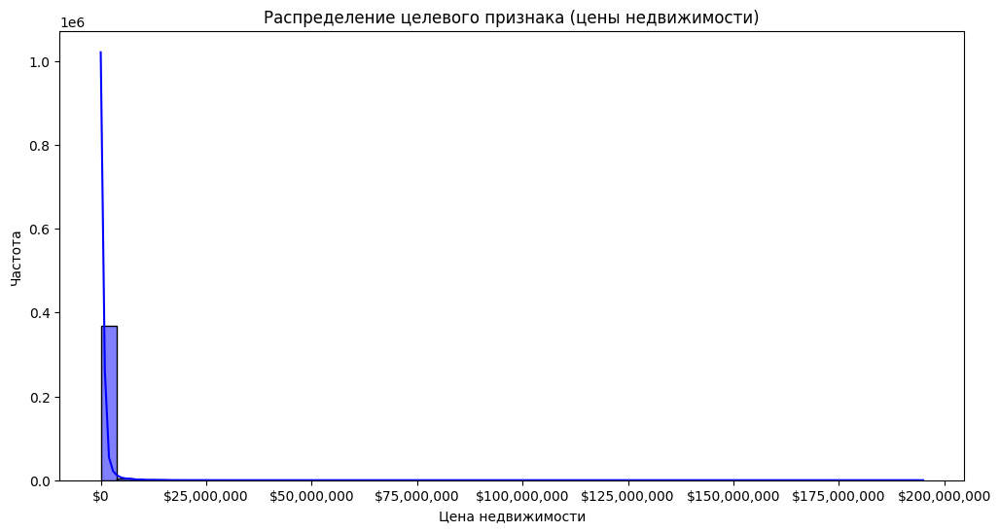

In [25]:


# Гистограмма распределения целевого признака
plt.figure(figsize=(12, 6))
sns.histplot(df['target'], bins=50, kde=True, color='blue')
plt.title('Распределение целевого признака (цены недвижимости)')
plt.xlabel('Цена недвижимости')
plt.ylabel('Частота')

# Настройка меток оси x для отображения в долларах
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('${x:,.0f}'))

plt.show()

### Вывод: Мы видим что у нас данные не распределены нормально 

### Применем тест на нормальность Normaltest

In [26]:
# берём уровень значимости 0.05
alpha = 0.05
n_test = normaltest(df['target'])
p_val = n_test[1]

if p_val < alpha:
    print('Отклоним нулевую гипотезу: Данные не распределены нормально')
else:
    print('Принимаем нулевую гипотезу: Данные распределены нормально')


Отклоним нулевую гипотезу: Данные не распределены нормально


### Применяем трансформацию Бокса-кокса 

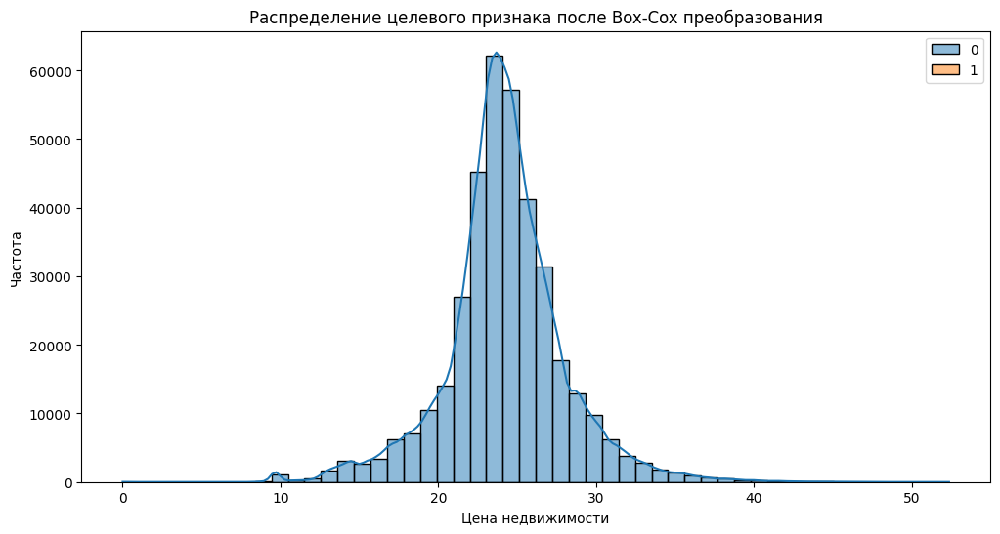

In [27]:
# Применяем преобразование Бокса-Кокса к целевой переменной
update_price = stats.boxcox(df['target'])

# Создаем график
plt.figure(figsize=(12, 6))
sns.histplot(update_price, bins=50, kde=True, color='blue')  
plt.title('Распределение целевого признака после Box-Cox преобразования')
plt.xlabel('Цена недвижимости')
plt.ylabel('Частота')


plt.show()


In [28]:
# Применяем наши изменения для целевой переменной
df['target'] = update_price[0]

In [29]:
df['target']

0         24.976296
1         24.000647
2         31.989488
3         31.245623
4         12.955896
            ...    
377180    28.788418
377181    26.597893
377182    25.757818
377183    17.603927
377184    22.692956
Name: target, Length: 374655, dtype: float64

### Вывод: Мы смогли приблизить данные к нормальности 

### Поработаем с признаком status, объединим похожие данные чтобы добиться лучшей интерпретируемости и чтобы нам было проще проводить дальнейшие манипуляции с данными 

In [30]:
# выводим уникальные значения 
df['status'].unique()

array(['Active', 'for sale', 'New construction', 'New', 'For sale',
       'Pending', 'P', 'Active/Contingent', ' / auction',
       'Under Contract', 'Pre-foreclosure / auction',
       'Under Contract   Showing', 'Pre-foreclosure',
       'Under Contract Backups', 'Active Under Contract', 'foreclosure',
       'Foreclosed', 'Option Pending', 'Under Contract Show', 'for rent',
       'Auction', 'A Active', 'Contingent', 'Pending   Continue To Show',
       'Price Change', 'Back on Market', 'Active Option', 'Foreclosure',
       'Coming soon: Nov 21.', 'Contingent Finance And Inspection',
       'Coming soon: Dec 4.', 'P Pending Sale', 'Coming soon: Nov 23.',
       'Active With Contingencies', 'Pending Ab', 'Pf', 'Contingent Show',
       'Contract P', 'Contingent Take Backup', 'Apartment for rent',
       'Backup Contract', 'Option Contract', 'Pending Continue To Show',
       'pending', 'Pending Inspection', 'Active Option Contract', 'C',
       'Auction - Active', 'Contingent   Sho

In [31]:
# проверим размер уникальных строк в наших значениях до преобразования 
df['status'].unique().shape[0]

156

In [32]:

def status_func(status):
    
    # Создаём списки топ слов 
    # остальные пометим как other 
    for_sale = ['for']
    active = ['active', 'a', 'active/contingent']
    fore_closure = ['foreclosure', 'auction', 'foreclosed', 'pre-foreclosure']
    pending = ['p', 'pending']
    contract = ['under', 'c']
    new = ['new']
    back_change = ['back','change']
    rent = ['rent']
    coming_soon = ['coming']
    # Приведем все символы к нижнему регистру
    # Разобьём на списки слов 
    splitted_st = status.lower().split(' ')

    for i in splitted_st:
        if i in active:
            return 'active'
        elif i in for_sale:
            return 'for sale'
        elif i in fore_closure:
            return 'foreclosure'
        elif i in pending:
            return 'pending'
        elif i in new:
            return 'new'
        elif i in back_change:
            return 'back changes'
        elif i in rent:
            return 'rent'
        elif i in contract: 
            return 'contract'
        elif i in coming_soon: 
            return 'coming soon'
    
    return 'other'



# преобразовываем в строки и применяем функцию 
df['status'] = df['status'].astype(str).apply(status_func)

In [33]:
# выведем все уникальные значения для признака status
df['status'].unique()

array(['active', 'for sale', 'new', 'pending', 'foreclosure', 'contract',
       'other', 'back changes', 'coming soon'], dtype=object)

In [34]:
# проверим размер строк в наших значениях после  преобразования 
df['status'].unique().shape[0]

9

In [35]:
# Узнаем какой статус наиболее популярный 
df['status'].value_counts().nlargest(10) 

status
for sale        239188
active          106526
foreclosure      10917
pending           6882
new               6148
contract          3000
other             1209
back changes       675
coming soon        110
Name: count, dtype: int64

### Вывод: мы смогли сократить количество слов для признака status путём объединения, этим мы сделали его более пригодным для анализа. Мы использовали множество операций замены для достижения этой цели. 
### Мы видим что for sale является самым популярным статусом.

### Группировка данных по статусу и вычисление среднего значения целевой переменной

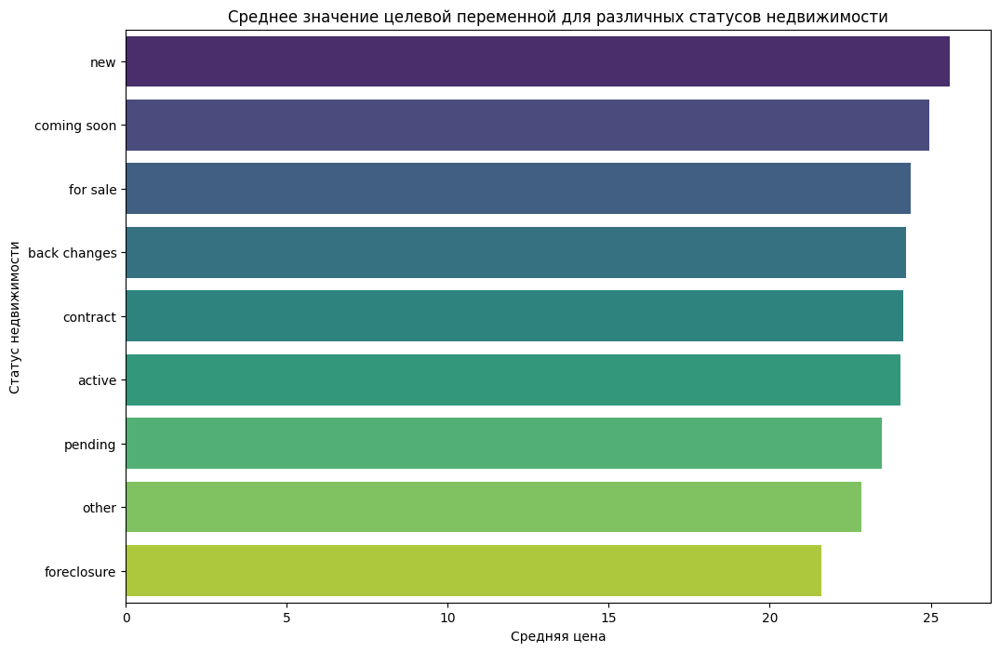

In [36]:

# Выведем топ значений
status_grouped = df.groupby('status')['target'].mean().nlargest(10)

# Построение горизонтальной столбчатой диаграммы
plt.figure(figsize=(12, 8))
sns.barplot(x=status_grouped.values, y=status_grouped.index, palette='viridis', hue=status_grouped.index)
plt.xlabel('Средняя цена')
plt.ylabel('Статус недвижимости')
plt.title('Среднее значение целевой переменной для различных статусов недвижимости')
plt.show()

### Вывод: new статус имеет самое высокое среднее значение(цену) среди всех статусов, что может указывать на то, что объекты недвижимости с этим статусом обычно имеют более высокие цены. Логично, так как это сразу указывает на что-то новое и дорогое. Также мы можем видеть соотношения других статусов к цене.

### 

### Поработаем также с признаком propertyType

In [37]:
# проверим размер уникальных строк в наших значениях до преобразования 
df['propertyType'].unique().shape[0]

1279

In [38]:
# выводим количество уникальных значений 
df['propertyType'].value_counts().nlargest(30)

propertyType
single-family home               125924
Single Family                     61886
Single Family Home                31725
condo                             25874
lot/land                          20506
Condo                             16494
townhouse                         11435
Land                              10933
multi-family                       7874
Condo/Townhome/Row Home/Co-Op      7701
Townhouse                          6909
Traditional                        5912
coop                               3264
Multi Family                       2771
High Rise                          1823
Ranch                              1781
Detached, One Story                1614
mobile/manufactured                1613
Single Detached, Traditional       1581
Contemporary                       1556
Multi-Family Home                  1501
1 Story                            1234
Colonial                           1204
Mobile / Manufactured              1056
Contemporary/Modern        

### Применяем регулярные выражения

In [39]:
# Уберём лишнее: запятые, тире, слеши
df['propertyType'] = df['propertyType'].replace('[/,\\-,\s]', ' ', regex=True)

### Строки с land обозначают землю, а нам нужно предсказать стоимость недвижимости, поэтому можно удалить это значение

In [40]:
# Удаляем строки, в которых в столбце propertyType встречается слово land
df = df[~df['propertyType'].str.contains('land', case=False, na=False)]

In [41]:
df['propertyType'].value_counts().nlargest(30)

propertyType
single family home               125924
Single Family                     61886
Single Family Home                31725
condo                             25874
Condo                             16494
townhouse                         11435
multi family                       7874
Condo Townhome Row Home Co Op      7701
Townhouse                          6909
Traditional                        5912
coop                               3264
Multi Family                       2792
High Rise                          1835
Ranch                              1781
Detached  One Story                1614
mobile manufactured                1613
Single Detached  Traditional       1581
Contemporary                       1556
Multi Family Home                  1501
1 Story                            1234
Colonial                           1204
Mobile   Manufactured              1056
Contemporary Modern                1000
2 Stories                           911
Mfd Mobile Home            

In [42]:

def property_type(property):
    
    # Создаём списки топ слов 
    # остальные пометим как other 
    single_family = [
        'single',
        'townhouse',
        'ranch',
        'traditional',
        'detached',
        'colonial',
        'contemporary'
    ]
    multi_family = ['multi', 'coop', 'condo','high','apartment']
    mobile = ['mobile']
    bungalow = ['bungalow']
    
    
    # Приведем все символы к нижнему регистру
    # Разобьём на списки слов 
    splitted_st = property.lower().split(' ')

    for i in splitted_st:
        if i in single_family:
            return 'single family home'
        elif i in multi_family:
            return 'multi family'
        elif i in mobile:
            return 'mobile'
        elif i in bungalow:
            return 'bungalow'
    
    return 'other'
    

#преобразовываем в строки и применяем функцию 
df.loc[:, 'propertyType'] = df['propertyType'].astype(str).apply(property_type)



In [43]:
# узнаем какой тип недвижимости преобладает в наших данных после распределения
df['propertyType'].value_counts()

propertyType
single family home    258411
multi family           69324
other                  11378
mobile                  3473
bungalow                 618
Name: count, dtype: int64

### Вывод: мы видим что у нас преобладает тип single family home 

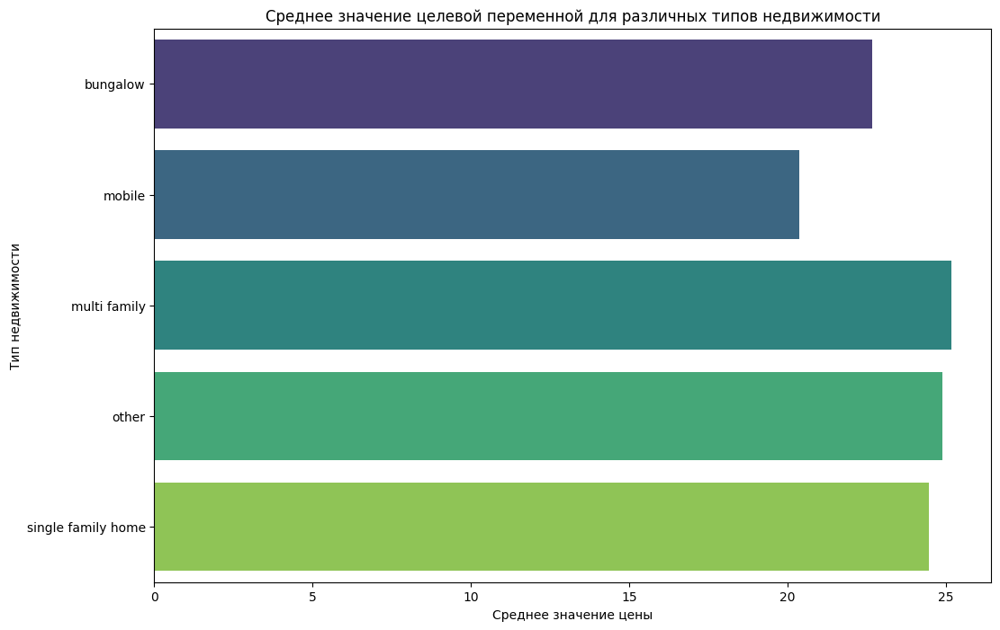

In [44]:
# Выведем топ 5 типов недвижимости и посчитаем среднее для целевой переменной
property_grouped = df.groupby('propertyType')['target'].mean()

# Построение горизонтальной столбчатой диаграммы
plt.figure(figsize=(12, 8))
sns.barplot(x=property_grouped.values, y=property_grouped.index, palette='viridis', hue=property_grouped.index)
plt.xlabel('Среднее значение цены')
plt.ylabel('Тип недвижимости')
plt.title('Среднее значение целевой переменной для различных типов недвижимости')
plt.show()

### Вывод: мы видим что среднее значение целевой переменной(цена) выше для типа недвижимости multi family. 
### Можно предположить что это связано с коммерческими объектами где нужно много места 

### Поработаем с признаком Stories(Количество Этажей)

In [45]:
# выведем уникальные значения для признака stories убывания
df['stories'].value_counts(ascending=False)

stories
1.0                                           65508
2.0                                           54556
1                                             22750
2                                             17948
3.0                                           11113
                                              ...  
2 Story or 2 Level                                1
Sixplex                                           1
Townhouse-2 Story, T3-Townhouse 3+ Stories        1
Multi-Level, New Englander                        1
65.0                                              1
Name: count, Length: 342, dtype: int64

### Посмотрим как распределены этажи создадим переменную  бинирования этажей и построим график

In [46]:
df['stories'].unique()

array([nan, '2.0', '1.0', '3.0', 'One', '2', 'Multi/Split', '4.0', '0.0',
       '0', 'One Level', '1', '9.0', '3', '1 Level, Site Built',
       'One Story', '3.00', '1.00', '14.0', 'Two', '3+', '1 Story', '5.0',
       '2 Story', 'Ranch/1 Story', 'Condominium', 'Stories/Levels', '7.0',
       '2 Level, Site Built', '2 Level', '15', '3 Level, Site Built', '4',
       '22.0', '2.00', '6.0', '1.0000', '3 Story', 'Three Or More', '1.5',
       '1 Level', 'Two Story or More', 'Site Built, Tri-Level', '54.0',
       '23', 'Farm House', '8.0', '16.0', '1.50', '18', '9', '21', '8',
       '12.0', 'Split Level w/ Sub', '11.0', '1.5 Stories', '7', '11',
       'Townhouse', '12', '21.0', '16', '1.5 Story/Basement', '28.0',
       'Traditional', '2.5 Story', '17', '2.0000', '63.0',
       'Ground Level, One', '6', 'Split Foyer', '2 Stories', '27.0',
       '19.0', '2.50', '1.30', '2 Story/Basement', 'Split Level',
       '1.5 Story', '1.5 Level', '2 Or More Stories',
       '1 Level, Condo, Site

In [47]:
def get_stories(data):
    """ 
    Функция возвращает число для столбца 'stories'.

    Она использует словарь для сопоставления слов с числами.
    Если слово найдено в словаре, возвращается соответствующее число.
    Если в строке присутствует число, оно возвращается.
    Если ничего не найдено, возвращается среднее значение.
    """

    # Словарь, сопоставляющий слова с числами
    nums = {
        'one': '1',
        'bungalow': '1',
        'two': '2',
        'traditional': '2',
        'bi-level': '2',
        'farm': '2',
        'three': '3',
        'tri': '3',
        'mid-rise': '4',
        'high-rise': '7'
    }

    # Ищем первое число в строке
    matched_num = re.match(r'\d+', data)
    # Разбиваем строку на слова и приводим их к нижнему регистру
    splitted = data.lower().split(' ')

    for i in splitted:
        # Если слово найдено в словаре, возвращаем соответствующее число
        if i in nums.keys():
            return int(nums[i])
        # Если найдено число в строке, возвращаем его
        elif matched_num:
            return int(matched_num[0])
        # Если слово состоит только из цифр, возвращаем его
        elif i.isdigit():
            return int(i)
    
    # Если ничего не найдено, возвращаем NaN
    return np.nan

# Применяем функцию к столбцу 'stories'
df['stories'] = df['stories'].astype(str).apply(get_stories)

# Заполняем пропуски средним значением
df['stories'].fillna(df['stories'].mean().round(), inplace=True)

In [48]:
# бинирования этажей чтобы увидеть картину в целом 
bins = [0, 1, 2, 5, 10, 20, 50, 100, 200, 500, float('inf')]
labels = ['1', '2', '3-5', '6-10', '11-20', '21-50', '51-100', '101-200', '201-500', '500+']
df_binned = pd.cut(df['stories'], bins=bins, labels=labels)


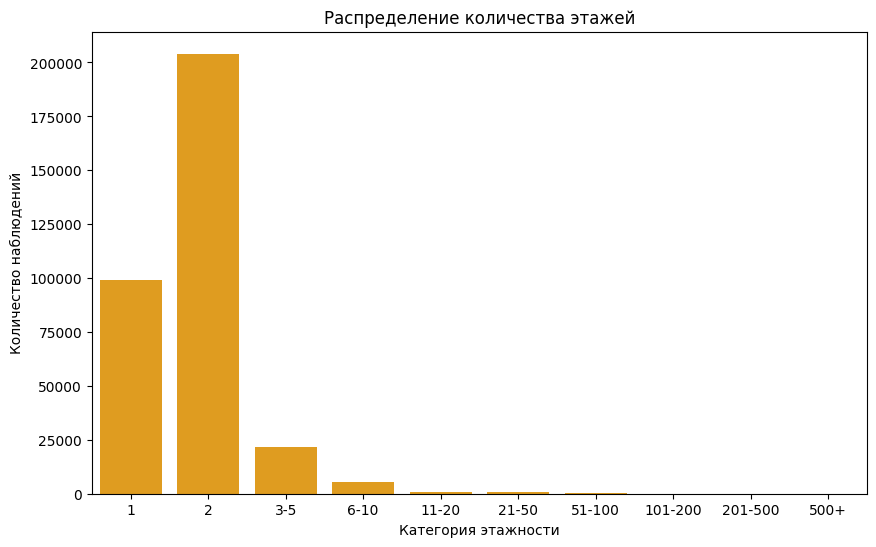

In [49]:
# Построим bar plot для бинированных данных
plt.figure(figsize=(10, 6))
sns.countplot(x=df_binned, data=df, order=labels, color='orange')
plt.title('Распределение количества этажей')
plt.xlabel('Категория этажности')
plt.ylabel('Количество наблюдений')
plt.show()

### Вывод: Мы видим, что у нас больше всего недвижимости с 2 этажами. Это логично, так как  чаще всего дома строят с  2 этажами

### Посмотрим как количество ванных комнат(baths) влияет на цену и также обработаем признак

In [50]:
# выводим уникальные значения 
df['baths'].unique().tolist()

['3.5',
 '3 Baths',
 '2 Baths',
 '8 Baths',
 '2',
 '3',
 'Bathrooms: 2',
 '1,750',
 '4 Baths',
 '2 ba',
 'Bathrooms: 5',
 '1,000',
 '7 Baths',
 '2.0',
 '3.0',
 'Bathrooms: 1',
 '4.0',
 '2.1 Baths',
 '2.5 Baths',
 '1',
 'Bathrooms: 3',
 '4.5',
 '6 Baths',
 'Bathrooms: 4',
 '3 ba',
 '5',
 '2,500',
 '5.5 Baths',
 '1.0',
 '5 Baths',
 '1.5',
 '4',
 '~',
 '2.5',
 '4,000',
 '3.5 Baths',
 '2,000',
 '3,000',
 '8.0',
 '1 ba',
 '5.0',
 '1,500',
 '7.0',
 '1,250',
 '9 Baths',
 '2,250',
 '6.0',
 '12 Baths',
 '5.5',
 '3,500',
 '1.5 Baths',
 '2,750',
 'Bathrooms: 6',
 '4.5 Baths',
 '0',
 '750',
 '5.5+',
 '6',
 '10 Baths',
 '6 ba',
 'Bathrooms: 19',
 '10.0',
 '4 ba',
 '12 ba',
 '2.5+',
 '8',
 '7.5+',
 'Bathrooms: 10',
 '0 / 0',
 'Sq. Ft. ',
 '5 ba',
 '4.5+',
 '18 Baths',
 '-- baths',
 'Bathrooms: 7',
 '7',
 '18',
 '3.5+',
 '1.5+',
 '11 Baths',
 '5,000',
 '1.75 Baths',
 '9',
 '12.0',
 '6.5',
 'Bathrooms: 8',
 '10',
 '19 Baths',
 'Bathrooms: 9',
 '16 Baths',
 '13 Baths',
 'Bathrooms: 13',
 '14',
 '9.0',


In [51]:
def get_baths_num(bath):
    """ Функция возвращает количество ванных 
    А также отмечает если там есть треть или четверть ванны и тд """

    if isinstance(bath, str):
        # Ищем все последовательности цифр в строке
        f_list = re.findall('\d+', bath)
        if len(f_list) == 1:
            nums = int(f_list[0])
            # Проверяем, не является ли число аномально большим
            if nums>100: # Если число больше 100, считаем его частью второй ванны
                return [0, f_list[0]] 
            else:       # Иначе считаем его полным количеством ванн
                return [f_list[0], 0]
        
        # Если найдены две последовательности цифр
        elif len(f_list) == 2:
            # Возвращаем количество ванн полного типа и дополнительных ванн
            return [f_list[0], f_list[1]]

        else:
            return [0, 0] # Если нет последовательностей цифр, возвращаем 0 для обоих типов ванн

    else:
        return [0, 0] # Если аргумент не является строкой, возвращаем 0 для обоих типов ванн

num_baths = df['baths'].apply(get_baths_num)
# Выделение количества ванн полного типа и дополнительных ванн в отдельные функции
df['num_baths'] = num_baths.apply(lambda x: int(x[0]))
df['additional_bath'] = num_baths.apply(lambda x: int(x[1]))


In [52]:
def addition_bath_check(bath):
    """ Функция возвращает число дополнительных ванных  """
    if bath<10:
        return bath/10

    elif bath>=10 and bath<100:
        return bath/100
    
    elif bath>=100:
        return bath/1000

df['additional_bath'] = df['additional_bath'].apply(addition_bath_check)
df['additional_bath'] = df['additional_bath'].apply(lambda x: x if x>0.25 else 0.25)

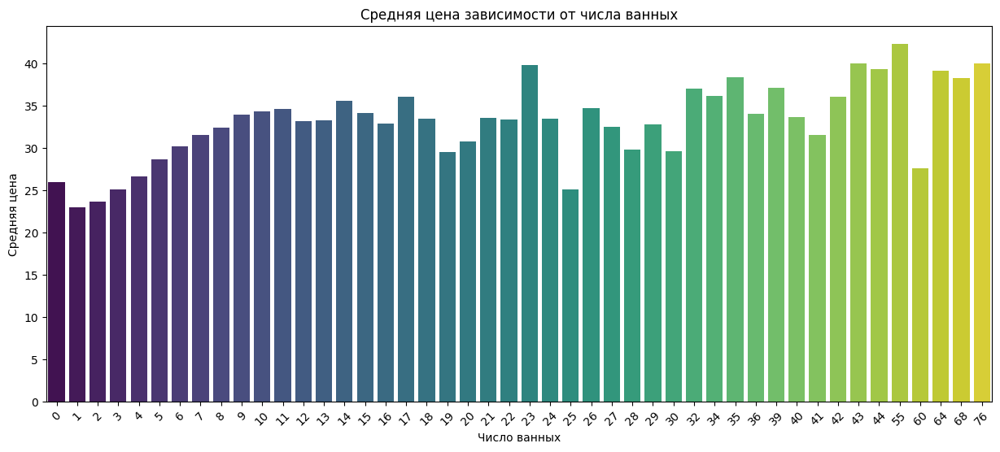

In [53]:
# Создаём переменную средних цен для каждого количества ванных комнат
price_baths = df.groupby('num_baths', as_index=False)['target'].mean()

# Построим столбчатую диаграмму 
plt.figure(figsize=(15, 6))
sns.barplot(x='num_baths', y='target', data=price_baths, palette='viridis', dodge=False)
plt.title('Средняя цена зависимости от числа ванных')
plt.xlabel('Число ванных')
plt.ylabel('Средняя цена')


plt.xticks(rotation=45)
plt.show()





<Axes: xlabel='additional_bath', ylabel='target'>

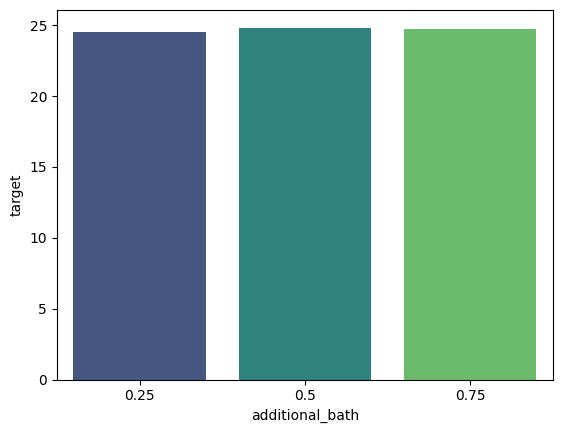

In [54]:
price_per_additional_bath = df.groupby('additional_bath', as_index=False)['target'].mean()
sns.barplot(
    data=price_per_additional_bath,
    x='additional_bath',
    y='target',
    palette='viridis'
)

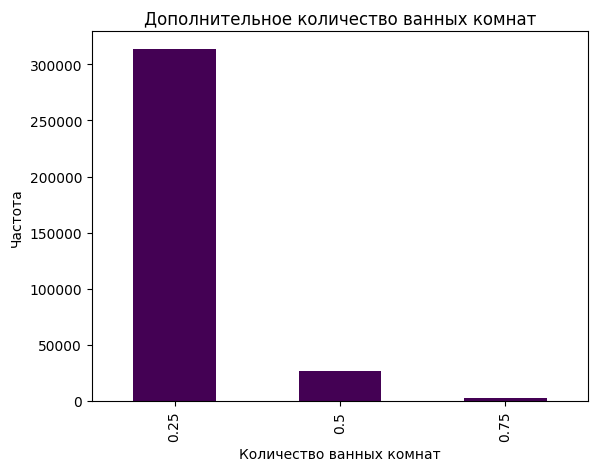

In [55]:
# Подсчет количества ванных комнат
bath_counts = df['additional_bath'].value_counts()

# Создание столбчатой диаграммы
bath_counts.plot(kind='bar', colormap='viridis')

# Настройка заголовка и подписей осей
plt.title('Дополнительное количество ванных комнат')
plt.xlabel('Количество ванных комнат')
plt.ylabel('Частота')
plt.colormaps

# Отображение графика
plt.show()

In [56]:
# Исходный признак удалим
df.drop('baths', axis=1, inplace=True)


### Вывод: Мы видим что у нас  до 11 ванн идёт плавный рост средней цены. А вот с дополнительными ванными мы можем видеть как несбалансированы данные. Цена выше в среднем для 0.5 дополнительных ванн 

### Тоже самое сделаем с признаком beds

In [57]:
# выведем уникальные значения списком 
df['beds'].unique().tolist()

['4',
 '3 Beds',
 '5 Beds',
 '2 Beds',
 '3',
 '4 Beds',
 '3 bd',
 'Baths',
 '4 bd',
 '5 bd',
 '8 Beds',
 '2',
 '2 bd',
 '2.0',
 '5',
 '1',
 '3.0',
 '6 Beds',
 'Bath',
 '12 Beds',
 '6',
 '14',
 '0.25 acres',
 '-- bd',
 '7',
 '5.0',
 '4.0',
 ' ',
 '7 Beds',
 '1 bd',
 '9 Beds',
 '0.44 acres',
 '0',
 '1.43 acres',
 '0.32 acres',
 '8,637 sqft',
 '6 bd',
 '7.0',
 '16 Beds',
 '9.7 acres',
 '1.0',
 '16 bd',
 '8',
 '10,310 sqft',
 '6,250 sqft',
 '3.02 acres',
 '2 acres',
 '5,000 sqft',
 '0.96 acres',
 '6.0',
 '13 bd',
 '6.31 acres',
 '0.6 acres',
 '9',
 '5,662 sqft',
 '2,200 sqft',
 '10',
 '18 Beds',
 '10 Beds',
 '0.46 acres',
 '0.59 acres',
 '20 Beds',
 '2,874 sqft',
 '0.26 acres',
 '10 bd',
 '32',
 '0.4 acres',
 '2,178 sqft',
 '6,351 sqft',
 '4,356 sqft',
 '5 acres',
 '0.55 acres',
 '5,501 sqft',
 '8,001 sqft',
 '0.7 acres',
 '1.69 acres',
 '0.88 acres',
 '0.34 acres',
 '13 Beds',
 '1.5 acres',
 '0.97 acres',
 '7,405 sqft',
 '0.0',
 '7 bd',
 '8.43 acres',
 '1,502 sqft',
 '8,712 sqft',
 '8,189

In [58]:
def get_beds_num(info):
    """ Функция которая принимает на вход строку
    а возвращает число"""
    
        
    # Ищем первую последовательность цифр в строке
    searched = re.search(r'\d+', info)
    
    if searched:
        val = int(searched[0])

        if val<150:
            return val
        
        else:
            return 0
    
    else:
        return 0
    
# Применяем функцию
df['beds'] = df['beds'].astype(str).apply(get_beds_num)

In [59]:
# выведем уникальные значения 
df['beds'].unique()

array([  4,   3,   5,   2,   0,   8,   1,   6,  12,  14,   7,   9,  16,
        10,  13,  18,  20,  32,  11,  26, 144,  22,  24,  63,  15,  28,
        60,  36,  19,  48,  25,  17,  27,  37,  40,  47,  23,  44,  30,
        33,  38,  31,  34,  99,  78,  58,  53,  50, 102,  21, 106,  75,
        29, 100,  39,  52,  42, 123,  46,  76,  70,  35,  88])

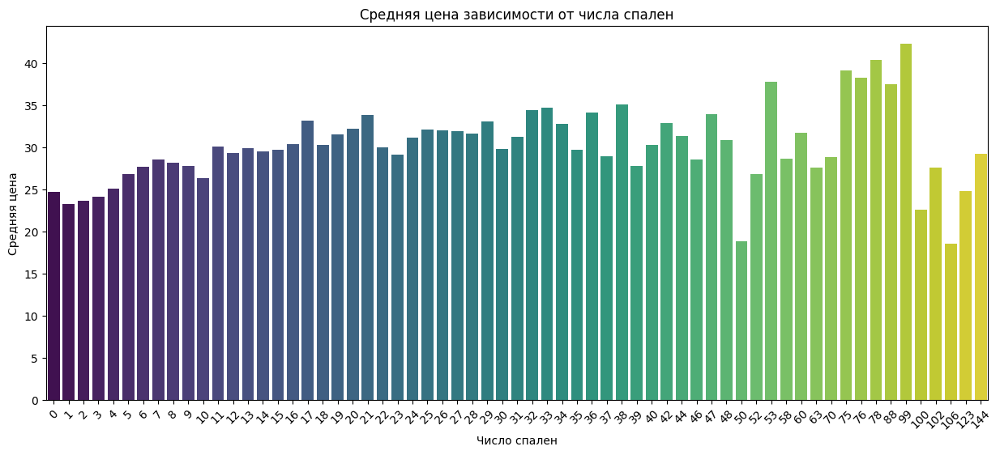

In [60]:

# Создаём переменную средних цен для каждого количества спален
price_beds = df.groupby('beds', as_index=False)['target'].mean()

# Построим столбчатую диаграмму 
plt.figure(figsize=(15, 6))
sns.barplot(x='beds', y='target', data=price_beds, palette='viridis', dodge=False)
plt.title('Средняя цена зависимости от числа спален')
plt.xlabel('Число спален')
plt.ylabel('Средняя цена')

plt.xticks(rotation=45)
plt.show()

### Вывод: Мы видим примерно что от 0 до 21 цена растёт, а вот потом уже происходят резкие скачки 

### Построим график распределения средней цены по штатам 

In [61]:
# Группировка данных по штатам и подсчет средней цены для каждого штата
state_counts = df.groupby('state')['target'].mean().reset_index()
state_counts.columns = ['Штаты', 'Средняя цена']

# Код для построения географической карты (choropleth map)
fig = px.choropleth(
    state_counts,
    locations='Штаты',
    locationmode='USA-states',  # Используем режим 'USA-states' для штатов США
    color='Средняя цена',
    color_continuous_scale='Viridis',
    title='Распределение средней цены по штатам',
    labels={'Средняя цена': 'Средняя цена'}
)

fig.update_geos(fitbounds="locations", visible=False)
fig.show()

### Вывод: Мы видим, что у нас дороже всего средняя цена на недвижимость в штатах CA и NY, а дешевле в штате MI. 
### Можно предположить, что это связано с развитием и притоком капитала, ведь в Калифорнии находятся почти все  главные офисы Big tech. Тут и SpaceX, Intel, Silicon Valley, средняя зп выше и все хотят там жить поэтому цена на жильё будет выше. Ну а в штате Нью-Йорк также находится много всего передового, например Wall Street и Биржа США.

### Преобразуем признак schools

In [62]:
# выведем информации из признака
df['schools'].head(3).to_list()

['[{\'rating\': [\'4\', \'4\', \'7\', \'NR\', \'4\', \'7\', \'NR\', \'NR\'], \'data\': {\'Distance\': [\'2.7 mi\', \'3.6 mi\', \'5.1 mi\', \'4.0 mi\', \'10.5 mi\', \'12.6 mi\', \'2.7 mi\', \'3.1 mi\'], \'Grades\': [\'3–5\', \'6–8\', \'9–12\', \'PK–2\', \'6–8\', \'9–12\', \'PK–5\', \'K–12\']}, \'name\': [\'Southern Pines Elementary School\', \'Southern Middle School\', \'Pinecrest High School\', \'Southern Pines Primary School\', "Crain\'s Creek Middle School", \'Union Pines High School\', \'Episcopal Day Private School\', \'Calvary Christian Private School\']}]',
 "[{'rating': ['4/10', 'None/10', '4/10'], 'data': {'Distance': ['1.65mi', '1.32mi', '1.01mi'], 'Grades': ['9-12', '3-8', 'PK-8']}, 'name': ['East Valley High School&Extension', 'Eastvalley Middle School', 'Trentwood Elementary School']}]",
 "[{'rating': ['8/10', '4/10', '8/10'], 'data': {'Distance': ['1.19mi', '2.06mi', '2.63mi'], 'Grades': ['6-8', 'K-5', '9-12']}, 'name': ['Paul Revere Middle School', 'Brentwood Science Scho

### Для начала поработаем со значением rating 

In [63]:
def process_school_ratings(data):
    
    
    # Используем регулярные выражения, чтобы найти подстроки rating
    s_rating = data['schools'].str.findall(r"\brating': ([\s\S]+?), 'data\b")
    
    # Избавимся от лишней вложенности 
    s_rating = s_rating.apply(lambda x: x[0])
    
    # Избавимся от лишних символов 
    s_rating = s_rating.replace('/10', '', regex=True)
    s_rating = s_rating.str.replace('[a-zA-Z]', '', regex=True)
    
    # Находим все цифры отдельно
    s_rating = s_rating.str.findall(r'\b([0-9])\'')
    
    # Преобразовываем в числа 
    s_rating = s_rating.apply(lambda x: [float(i) for i in x])
    
    # Находим средний рейтинг для каждой школы 
    s_rating = s_rating.apply(lambda x: np.average([int(i) for i in x]))
    
    # Создаем признак school_r_mean в нашем наборе данных. Пропуски заполняем -1 
    data.loc[:, 'school_r_mean'] = s_rating.fillna(-1).round()

# Применяем функцию к df
process_school_ratings(df)

### Теперь поработаем со значением Distance

In [64]:
def get_distance(data):
    
    # Используем регулярные выражения, чтобы найти подстроки Distance
    s_distance = df['schools'].str.findall(r"\bDistance': ([\s\S]+?), 'Grades\b")
    # Избавляемся от вложенности
    s_distance = s_distance.apply(lambda x: x[0])
    # Избавимся от лишних символов 
    s_distance = s_distance.str.replace('[a-zA-Z]', '', regex=True)
    # находим все цифры с плавающей точкой отдельно 
    s_distance = s_distance.str.findall(r'\b([0-9]+.[0-9]+)')
    # преобразовываем в числа 
    s_distance = s_distance.apply(lambda x: [float(i) for i in x])
    # создаём признак school_dist и пустые значения заполняем -1
    data.loc[:,'school_dist'] = s_distance.apply(lambda x: -1 if not x  else min(x))
    
# Применяем функцию к df 
get_distance(df)

    

### Теперь поработаем с типами школ 

In [65]:
def get_school_type(name):
    """" Функция возвращает тип школы: elementary, middle, high """
    name_lower = name.lower()
    
    if 'elementary' in name_lower:
        return 'elementary'
    elif 'middle' in name_lower:
        return 'middle'
    elif 'high' in name_lower:
        return 'high'
    else:
        return 'unknown'

# преобразовываем в строки и применяем функцию 
df.loc[:, 'school_types'] = df['schools'].astype(str).apply(get_school_type)


In [66]:
# избавимся от признака schools
df.drop('schools', axis=1, inplace=True)    

### Поработаем с признаком homeFacts

In [67]:
df['homeFacts'].head(3).to_list()

["{'atAGlanceFacts': [{'factValue': '2019', 'factLabel': 'Year built'}, {'factValue': '', 'factLabel': 'Remodeled year'}, {'factValue': 'Central A/C, Heat Pump', 'factLabel': 'Heating'}, {'factValue': '', 'factLabel': 'Cooling'}, {'factValue': '', 'factLabel': 'Parking'}, {'factValue': None, 'factLabel': 'lotsize'}, {'factValue': '$144', 'factLabel': 'Price/sqft'}]}",
 "{'atAGlanceFacts': [{'factValue': '2019', 'factLabel': 'Year built'}, {'factValue': '', 'factLabel': 'Remodeled year'}, {'factValue': '', 'factLabel': 'Heating'}, {'factValue': '', 'factLabel': 'Cooling'}, {'factValue': '', 'factLabel': 'Parking'}, {'factValue': '5828 sqft', 'factLabel': 'lotsize'}, {'factValue': '$159/sqft', 'factLabel': 'Price/sqft'}]}",
 "{'atAGlanceFacts': [{'factValue': '1961', 'factLabel': 'Year built'}, {'factValue': '1967', 'factLabel': 'Remodeled year'}, {'factValue': 'Forced Air', 'factLabel': 'Heating'}, {'factValue': 'Central', 'factLabel': 'Cooling'}, {'factValue': 'Attached Garage', 'factL

### Примечание:

#### Извлекаем все значения (factValue) из столбца 'homeFacts' с использованием регулярного выражения 
#### \bfactValue': ([\s\S]+?), 'factLabel\b' Это регулярное выражение ищет подстроки, начинающиеся с 'factValue': ' и заканчивающиеся символом ', 'factLabel'. Затем оно захватывает все символы между ними, используя ([\s\S]+?), что означает "любой символ (включая пробелы) один или более раз".

### Второе регулярное выражение:
#### Извлекаем все значения меток (factLabel) из столбца 'homeFacts' с использованием регулярного выражения 
#### \bfactLabel': ([\s\S]+?)[}\b]
#### Это регулярное выражение ищет подстроки, начинающиеся с 'factLabel': ' и заканчивающиеся символом '}'.
#### Затем оно захватывает все символы между ними, используя ([\s\S]+?), что означает "любой символ (включая пробелы) один или более раз".

In [68]:
def home_facts_func(df):
    # Избавимся от лишней вложенности и используем регулярные выражения
    ser_val = df['homeFacts'].str.findall(r"\bfactValue': ([\s\S]+?), 'factLabel\b")
    # регулярное выражение ищет подстроки, начинающиеся с 'factLabel': ' и заканчивающиеся символом '}'
    ser_label = df['homeFacts'].str.findall(r"\bfactLabel': ([\s\S]+?)[}\b]")
    # Создадим датафрейм
    ser_label_len = pd.Series(ser_label.apply(lambda x: len(x)))
    
    # Создадим список названий признаков, удалив лишние кавычки
    list_value = ','.join(ser_label[0]).replace("'","").split(',')
    
    # Создадим эти признаки в нашем датафрейме
    for i, val in enumerate(list_value):
        df.loc[:, val] = ser_val.apply(lambda x: x[i])

# Применяем функцию к нашему датафрейму 
home_facts_func(df)

### Поработаем с датами Year built и Remodeled year

In [69]:
# Выведем уникальные значения 
df['Year built'].unique()

array(["'2019'", "'1961'", "'2006'", "'1920'", "'1976'", "'1970'",
       "'1965'", "'2015'", "'1996'", "'1982'", "'1905'", "'2008'",
       "'1899'", "'2016'", "'1954'", "'1989'", "'2014'", "'1915'", "''",
       "'1994'", "'1910'", "'1923'", "'1960'", "'1977'", "'1972'",
       "'1963'", "'1981'", "'1949'", "'1930'", "'1991'", "'1958'",
       "'2005'", "'2017'", "'2018'", "'1983'", "'1928'", "'1998'",
       "'1997'", "'1964'", "'1940'", "'1973'", "'1968'", "'1999'",
       "'1918'", "'2007'", "'1984'", "'1946'", "'2003'", "'2000'",
       "'2004'", "'1969'", "'2002'", "'1952'", "'1974'", "'1947'",
       "'1957'", "'1978'", "'1956'", "'1967'", "'1975'", "'1988'",
       "'1955'", "'1950'", "'1959'", "'2012'", "'1924'", "'1966'",
       "'1992'", "'2001'", "'1995'", "'2010'", "'1971'", "'1909'",
       "'1953'", "'1993'", "'1990'", "'1980'", "'1985'", "'1951'",
       "'1907'", "'1885'", "'1941'", "'1927'", "'1929'", "'1901'", 'None',
       "'1922'", "'1906'", "'1945'", "'1979'", "

In [70]:
def built_year(data):
    
    # избавимся от лишних кавычек
    data['Year built'] = data['Year built'].replace("'", '', regex=True)
    # Избавимся от лишних значений 
    data['Year built'] = data['Year built'].replace('1', '')
    data['Year built'] = data['Year built'].replace('1208', '')
    data['Year built'] = data['Year built'].replace('559990649990', '')
    data['Year built'] = data['Year built'].replace('No Data', '')
    # заменим даты с человеческим фактором, где человек, скорее всего, перепутал 0 с 9
    data['Year built'] = data['Year built'].replace({'1019': '1919', '1057': '1957', '1060': '1960'}, regex=False)
    # Заменим пустые строки на None 
    data['Year built'] = data['Year built'].replace('^\s*$', 'None', regex=True)
    
    # заменим строки в признаке на NaN значения 
    data['Year built'] = data['Year built'].replace('None', np.nan)

    # Удалим NaN значения 
    data.dropna(subset=['Year built'], inplace=True)

    # Переведём в числовой формат 
    data['Year built'] = data['Year built'].astype(int)
    
    

# Применяем нашу функцию
built_year(df)



In [71]:
# Преобразуем признак для лучшего вида
df['Year_built'] = df['Year built']
# Посмотрим количество уникальных значений 
df['Year_built'].value_counts()

Year_built
2019    32024
2006     7928
2005     7424
2007     7053
2018     6767
        ...  
1740        1
1805        1
1843        1
1808        1
1804        1
Name: count, Length: 219, dtype: int64

In [72]:
# избавимся от признака Year built
df.drop('Year built', axis=1, inplace=True)   

### Признак Remodeled year

In [73]:
df['Remodeled year'].value_counts()

Remodeled year
''        138541
None       21616
'2006'      5463
'2005'      4738
'2007'      4318
           ...  
'1870'         1
'1853'         1
'1888'         1
'1738'         1
'1862'         1
Name: count, Length: 149, dtype: int64

In [74]:
df['Remodeled year'].unique()

array(["''", "'1967'", "'2006'", 'None', "'2015'", "'1997'", "'2019'",
       "'1982'", "'1905'", "'2009'", "'2007'", "'1996'", "'1995'",
       "'1988'", "'1972'", "'1949'", "'1954'", "'1930'", "'2000'",
       "'1994'", "'2005'", "'1983'", "'2003'", "'1965'", "'1968'",
       "'1993'", "'1999'", "'2014'", "'2008'", "'2010'", "'2004'",
       "'2002'", "'1952'", "'1978'", "'1975'", "'1947'", "'1957'",
       "'1950'", "'1970'", "'2016'", "'1989'", "'1998'", "'1980'",
       "'1973'", "'1955'", "'1991'", "'2011'", "'2017'", "'1986'",
       "'1941'", "'2001'", "'1990'", "'1979'", "'1901'", "'1984'",
       "'1918'", "'1977'", "'1962'", "'1956'", "'2013'", "'1960'",
       "'1981'", "'1969'", "'1987'", "'1958'", "'1925'", "'1964'",
       "'1966'", "'1992'", "'1943'", "'1961'", "'1948'", "'1931'",
       "'2012'", "'1976'", "'1974'", "'1935'", "'1910'", "'1940'",
       "'1971'", "'2018'", "'1916'", "'1914'", "'1963'", "'1985'",
       "'1951'", "'1942'", "'1959'", "'1927'", "'1946'", "

#### Будем считать что где отсутствуют значения и где == NaN, то  объекты не прошли реконструкцию

In [75]:
# Приводим к нижнему регистру 
df['Remodeled year'] = df['Remodeled year'].str.lower()
# избавимся от лишних кавычек
df['Remodeled year'] = df['Remodeled year'].replace("'", '', regex=True)
# Заменим пустые строки на None 
df['Remodeled year'] = df['Remodeled year'].replace('^\s*$', 'none', regex=True)
# посмотрим на колличество None в %
print(f"Процент none: {round(df[df['Remodeled year']=='none'].shape[0]/df.shape[0]*100, 2)}%")
print(f"Количество none: {df.loc[df['Remodeled year']=='none', 'Remodeled year'].count()}")

Процент none: 52.18%
Количество none: 160157


In [76]:

# заменим строки в признаке на NaN значения 
df['Remodeled year'] = df['Remodeled year'].replace('none', np.nan)
# Заполним значения NaN нулями
df['Remodeled year'].fillna(0, inplace=True)
# Преобразуем в числовой вид 
df['Remodeled year'] = df['Remodeled year'].apply(lambda x: x if x==0 else 1)

In [77]:
df['Remodeled year'].value_counts()

Remodeled year
0    160157
1    146752
Name: count, dtype: int64

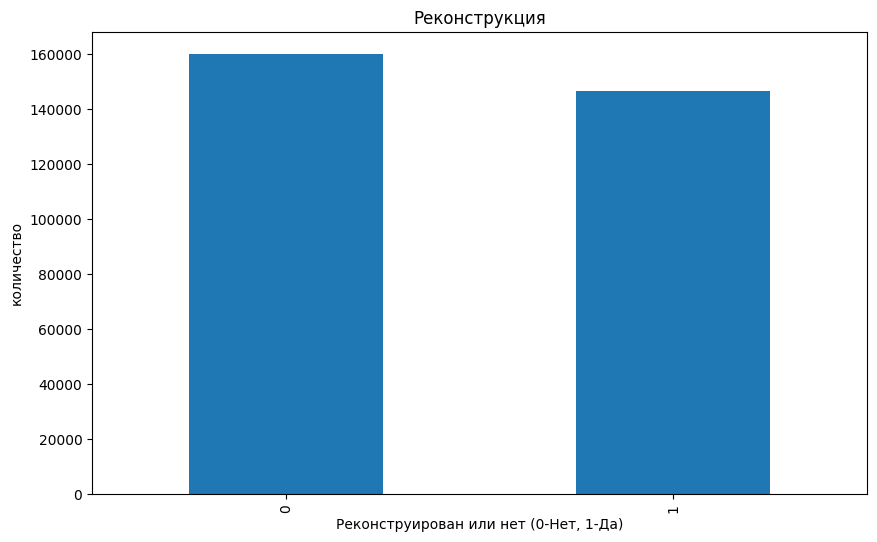

In [78]:

df['Remodeled year'].value_counts().plot(kind='bar', figsize=(10, 6))

plt.title('Реконструкция')
plt.xlabel('Реконструирован или нет (0-Нет, 1-Да)')
plt.ylabel('количество')
plt.show()

#### Вывод: Мы видим, что домов которые не  прошли реконструкцию больше чем тех которые  прошли  Однако пропусков слишком много что даёт нам право удалить данный признак 

### Heating & Cooling 

#### В признаке Cooling приведены тепловые показатели, а в признаке Heating приведены показатели охлаждения.

In [79]:
# Посчитаем уникальные значения 
df['Heating'].value_counts()

Heating
'Forced Air'                                                      80285
''                                                                51301
'Forced air'                                                      50695
'Other'                                                           28005
'Central Air'                                                      7801
                                                                  ...  
'Exhaust Fans'                                                        1
'Central, Exhaust Fans, Natural Gas, Zoned'                           1
'BR Closet-Electric - new'                                            1
'Wood Stove'                                                          1
'Baseboard, Hot Water, Programmable Thermostat, Radiant Floor'        1
Name: count, Length: 1973, dtype: int64

#### Делаем всё тоже самое что и с признаком Remodeled year и оставляем 2 значения 0-нет 1-есть

In [80]:
def heat_func(heat):
    
    # Приведём к нижнему регистру 
    heat = heat.str.lower()
    # избавимся от лишних кавычек
    heat = heat.replace("'", '', regex=True)
    # Заменим пустые строки на none 
    heat = heat.replace('^\s*$', 'none', regex=True)
    # Заменим значения no data на none 
    heat = heat.replace('no data', 'none')
    # заменим строки в признаке на NaN значения 
    heat = heat.replace('none', np.nan)
    # Заполним значения NaN нулями
    heat.fillna(0, inplace=True)
    # Преобразуем в числовой вид 
    heat = heat.apply(lambda x: x if x==0 else 1)
    
    return heat
    
# Применяем нашу функцию   
df['Heating'] = heat_func(df['Heating'])

In [81]:
df['Heating'].value_counts()

Heating
1    247839
0     59070
Name: count, dtype: int64

### Делаем тоже самое с признаком  Cooling и применяем функцию 

In [82]:
# Применяем функцию к признаку Cooling
df['Cooling'] = heat_func(df['Cooling'])

In [83]:
df['Cooling'].value_counts()

Cooling
1    229866
0     77043
Name: count, dtype: int64

### Переходим к признаку Parking. Признак будет бинарный: 0 - нет паркинг, 1 - есть паркинг.

In [84]:
df['Parking'].unique()

array(["''", "'Attached Garage'", "'Detached Garage'", ...,
       "'Basement, Detached'",
       "'Paved Driveway, Off Street, Detached Garage'",
       "'Deed Restrictions, Fitness, Gated Community, Golf Carts OK, No Truck/RV/Motorcycle Parking, Pool, Special Community Restrictions'"],
      dtype=object)

In [85]:
df['Parking'].value_counts()

Parking
''                                                                                                                                    111613
'Attached Garage'                                                                                                                      68251
'2 spaces'                                                                                                                             27229
'1 space'                                                                                                                              14029
'Detached Garage'                                                                                                                      12752
                                                                                                                                       ...  
'Detached Garage, Off Street, On Street'                                                                                                   1
'Gara

In [86]:
def parking_func(parking):
    
    # Приведём к нижнему регистру 
    parking = parking.str.lower()
    # избавимся от лишних кавычек
    parking = parking.replace("'", '', regex=True)
    
    parking=parking.apply(lambda x: 0 
            if x==0 or x=='' or x=='no data' or x=='no' else 1) 
    
    return parking
    
# Применяем нашу функцию   
df['Parking'] = parking_func(df['Parking'])

In [87]:
df['Parking'].value_counts()

Parking
1    182635
0    124274
Name: count, dtype: int64

#### Вывод: как мы видим в большинстве домов есть парковка

### lotsize

In [88]:
def get_lotsize(lot):

    """" Функция возвращает значение размера участка
    в квадратных футах """
    # Приведем строку к нижнему регистру 
    lot = lot.lower()
    # Разделим строку на список слов
    lot_list = lot.split(' ')
    # Количество квадратных футов в акре.
    acr = 43560
    # Ищем числа с плавающей точкой в строке
    num_float = re.search('\d+[,.]\d+', lot)
    # Ищем целые числа в строке
    num_int = re.search('\d+', lot)

    if num_float:
        num = num_float[0]

        if '.' in num:
    # Если число с плавающей точкой, умножим на количество квадратных футов в акре.

            num = float(num)*acr
            return num
    # Если число с запятой, уберем запятую и преобразуем в целое число.
        elif ',' in num:
            num = num.replace(',', '')
            num = int(num)
            return num


    elif num_int:
    # Если найдено целое число, преобразуем его в int.
        num = num_int[0]
        num = int(num)
        return num

    else:
        return 0

# Применяем нашу функцию 
df['lotsize'] = df['lotsize'].astype(str).apply(get_lotsize)

### Признак  Street

#### Как мы знаем, нумерация домов в США отличается от России. Я пропускаю все объяснения и отмечаю, что для того, чтобы узнать, где находится дом на улице, нам нужны две последние цифры в адресе. Пояснение: если число близко к 0 или 100, мы можем сказать, что дом находится в начале или в конце улицы соответственно. Если число близко к 50, это означает, что дом находится в середине улицы.

In [89]:
def get_num_type(address):

    """ Функция возвращает типы улиц и
    последние две цифры номера части адреса """

    abbrev_list = ['st', 'ave', 'ln', 'rd', 'ct', 'dr', 'cir', 'blvd', 'pl', 'plz']
    st_type = 'other'
    num = 0
    
    address = str(address)
    addr_list = address.lower().split(' ')
    
    for i in addr_list:

        if i in abbrev_list:
            st_type = i

        elif i.isdigit():
            num = int(i[-2:])

    return st_type, num

type_num = df.street.apply(get_num_type)
# Создаём признаки в нашем датасете 
# Тип улицы
df['street_type'] = type_num.apply(lambda x: x[0])
# Последние две цифры номера части адреса
df['house_loc'] = type_num.apply(lambda x: x[1])

# Заменяем pl на plz потому что они одинаковые
df['street_type'] = df['street_type'].apply(lambda x: 'plz' if x=='pl' else x)

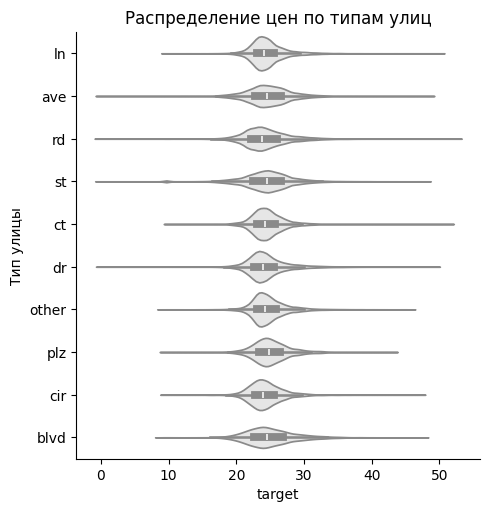

In [90]:
price_street = sns.catplot(
    data=df,
    x='target',
    y='street_type',
    kind='violin',
    color='.9'
)
price_street.set(
    title='Распределение цен по типам улиц',
    xlabel='target',
    ylabel='Тип улицы'
)

#### Вывод: Мы можем заметить что цена зависит от того в каком типе улице расположен дом. Можно предположить что это может быть связано с хорошей историей данного типа или же богатой инфраструктурой на той или иной улице

#### Теперь разделим местоположение дома на 5 зон 

In [91]:
def zone_splitter(zone):

    if zone in range(0, 11) or zone in range(91, 101):
        return 'zone1'
    
    elif zone in range(11, 21) or zone in range(81, 91):
        return 'zone2'

    elif zone in range(21, 31) or zone in range(71, 81):
        return 'zone3'

    elif zone in range(31, 41) or zone in range(61, 71):
        return 'zone4'

    else:
        return 'zone5'
    

df['street_zone'] =  df['house_loc'].apply(zone_splitter)

In [92]:
df['street_zone'].value_counts()

street_zone
zone1    99633
zone2    64894
zone3    54059
zone4    44173
zone5    44150
Name: count, dtype: int64

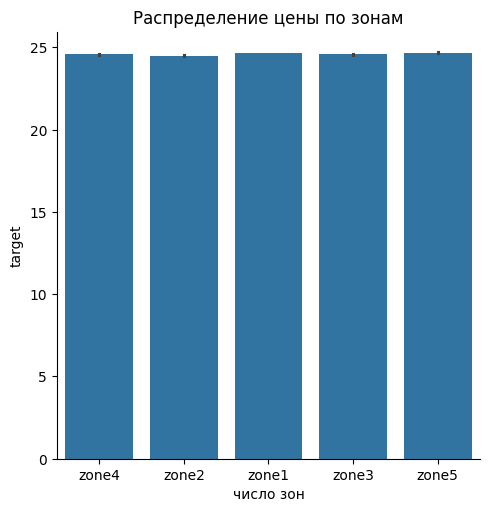

In [93]:
street_price = sns.catplot(
    data=df,
    x='street_zone',
    y='target',
    kind='bar'
)
street_price.set(
    xlabel='число зон',
    ylabel='target',
    title='Распределение цены по зонам'
)

### Вывод: Как мы можем увидеть самая высокая цена в зоне 1 

### Поработаем с признаком sqft

In [94]:
# Функция для извлечения чисел из строки, представляющей площадь
def extract_sqft(sqft):
# Ищем целые числа в строке 
    numbers = re.findall(r'\d+', sqft)
    if numbers:
        return int(''.join(numbers)) # Проверка, что список не пустой
    else:
        return 0 # Возвращаем 0 для пустых значений

df['sqft'] = df['sqft'].apply(extract_sqft)

In [95]:
df['sqft'].unique().tolist()

[2900,
 1947,
 3000,
 6457,
 897,
 1507,
 0,
 3588,
 1930,
 1300,
 3130,
 2839,
 1820,
 2454,
 2203,
 3325,
 3080,
 1612,
 1731,
 5266,
 1080,
 3645,
 1953,
 5796,
 2349,
 935,
 1736,
 1677,
 1176,
 1085,
 864,
 900,
 1448,
 1396,
 1232,
 1720,
 2388,
 1081,
 1101,
 5358,
 1683,
 1200,
 1873,
 1908,
 1632,
 4339,
 3756,
 2088,
 2688,
 1308,
 2200,
 1244,
 2272,
 770,
 1160,
 3928,
 2383,
 5131,
 4520,
 1250,
 1060,
 538,
 2375,
 1993,
 2347,
 2831,
 2991,
 818,
 2268,
 1916,
 107250,
 667,
 1587,
 1790,
 3685,
 960,
 2492,
 1553,
 719,
 972,
 3500,
 2012,
 1369,
 2275,
 1000,
 7362,
 4410,
 6040,
 1470,
 3439,
 1859,
 1776,
 2400,
 1405,
 1650,
 2415,
 754,
 1700,
 6224,
 1064,
 1350,
 2100,
 1372,
 109200,
 1444,
 4532,
 4368,
 1008,
 1075,
 1170,
 1062,
 914,
 3418,
 1488,
 1806,
 2358,
 1456,
 1344,
 3190,
 1517,
 1867,
 2726,
 2021,
 2632,
 4276,
 768,
 1996,
 2533,
 880,
 2255,
 2762,
 1672,
 2469,
 1152,
 2114,
 11598,
 3905,
 1234,
 3097,
 1500,
 1136,
 3408,
 2000,
 1430,
 1630

####

### Рассмотрим признак city

In [96]:
df['city'].unique().tolist()

['Southern Pines',
 'Spokane Valley',
 'Los Angeles',
 'Dallas',
 'Philadelphia',
 'POINCIANA',
 'Memphis',
 'Mason City',
 'Houston',
 'Flushing',
 'Pembroke Pines',
 'Eugene',
 'Brooklyn',
 'Fort Lauderdale',
 'New York',
 'Tomball',
 'Palmdale',
 'Bend',
 'Miami Beach',
 'Spring',
 'Killeen',
 'Washington',
 'Davie',
 'Tampa',
 'Pt Saint Lucie',
 'North Miami Beach',
 'Jacksonville',
 'Charlotte',
 'Fresno',
 'Miami',
 'Weston',
 'Las Vegas',
 'Sylmar',
 'Tyler',
 'Fort Worth',
 'Beechhurst',
 'Portland',
 'Hapeville',
 'Woodway',
 'Hernando Beach',
 'Plantation',
 'San Antonio',
 'Chicago',
 'Lakewood',
 'Seattle',
 'PORT CHARLOTTE',
 'Saint Johns',
 'Kissimmee',
 'Boston',
 'Durham',
 'Spokane',
 'The Woodlands',
 'Port Saint Lucie',
 'Panama City Beach',
 'Kew Gardens',
 'ORLANDO',
 'Palm Coast',
 'Burien',
 'Lauderdale Lakes',
 'Lauderhill',
 'Columbus',
 'Lakeway',
 'Coral Gables',
 'Westlake',
 'North Hollywood',
 'McKinney',
 'San Jose',
 'Bayside',
 'Huntington Beach',
 'Wor

In [97]:
df['city'].shape[0]

306909

In [98]:
# Создадим топ 100 уникальных категорий с городами 
top_city = df['city'].value_counts()[:100].index
# Остальные города занесём в other
df['city'] = df['city'].apply(lambda x: x if x in top_city else 'other')

In [99]:
df.columns

Index(['status', 'propertyType', 'street', 'homeFacts', 'city', 'sqft',
       'zipcode', 'beds', 'state', 'stories', 'MlsId', 'target', 'num_baths',
       'additional_bath', 'school_r_mean', 'school_dist', 'school_types',
       'Remodeled year', 'Heating', 'Cooling', 'Parking', 'lotsize',
       'Price/sqft', 'Year_built', 'street_type', 'house_loc', 'street_zone'],
      dtype='object')

In [100]:
df.head()

,status,propertyType,street,homeFacts,city,sqft,zipcode,beds,state,stories,...,Remodeled year,Heating,Cooling,Parking,lotsize,Price/sqft,Year_built,street_type,house_loc,street_zone
0,active,single family home,240 Heather Ln,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",other,2900,28387,4,NC,2.0,...,0,1,0,0,0.0,'$144',2019,ln,40,zone4
1,for sale,single family home,12911 E Heroy Ave,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",other,1947,99216,3,WA,2.0,...,0,0,0,0,5828.0,'$159/sqft',2019,ave,11,zone2
2,for sale,single family home,2005 Westridge Rd,"{'atAGlanceFacts': [{'factValue': '1961', 'fac...",Los Angeles,3000,90049,3,CA,1.0,...,1,1,1,1,8626.0,'$965/sqft',1961,rd,5,zone1
3,for sale,single family home,4311 Livingston Ave,"{'atAGlanceFacts': [{'factValue': '2006', 'fac...",Dallas,6457,75205,5,TX,3.0,...,1,1,1,1,8220.0,'$371/sqft',2006,ave,11,zone2
5,for sale,single family home,1624 S Newkirk St,"{'atAGlanceFacts': [{'factValue': '1920', 'fac...",Philadelphia,897,19145,2,PA,2.0,...,0,1,1,0,680.0,'$233/sqft',1920,st,24,zone3


### Избавимся от лишних признаков

#### Удаляем признак Price/sqft, так как у нас есть уже отдельный признак sqft и цена-target. Данный признак создаёт утечку
#### Также удаляем оставшиеся признаки которые особо не повлияют на предсказание.


In [101]:
df.drop(columns=['Price/sqft', 'Remodeled year', 'homeFacts',  'street', 'house_loc'], axis=1, inplace=True)

### Прологарифмируем целевую переменную и создадим новый признак чтобы сгладить выбросы

In [102]:
df['target_log'] = np.log(df['target']+1)

#### Проведём ещё один тест Колмагорова-Смирнова, если pvalue меньше 0.05, отвергнем нулевую гипотезу, принимаем альтернативную, значит данные не распределены нормально 

In [103]:
stats.kstest(df['target'], 'norm')

KstestResult(statistic=0.9999739336415673, pvalue=0.0, statistic_location=7.974412923244546, statistic_sign=-1)

### Произведём кодирование признаков 

In [104]:
# Рассмотрим наши оставшиеся категориальные признаки
df.describe(include=object)

,status,propertyType,city,zipcode,state,MlsId,school_types,street_type,street_zone
count,306909,306909,306909,306909,306909,306909,306909,306909,306909
unique,9,5,101,4388,37,187896,4,10,5
top,for sale,single family home,other,33131,FL,NO MLS,elementary,st,zone1
freq,201176,224667,81942,1535,94018,52042,256528,71749,99633


### Закодируем  признаки 

In [105]:
from category_encoders import BinaryEncoder

# Выбираем категориальные признаки
cat_features = df.select_dtypes(include=['object']).columns.tolist()

# Создаем экземпляр BinaryEncoder
enc = BinaryEncoder()

# Применяем BinaryEncoder к категориальным признакам
df_binary_encoded = enc.fit_transform(df[cat_features])

# Объединяем закодированные признаки с исходным DataFrame
df = pd.concat([df, df_binary_encoded], axis=1)

# Удаляем оригинальные категориальные признаки
df.drop(cat_features, axis=1, inplace=True)

In [106]:
df.head()

,sqft,beds,stories,target,num_baths,additional_bath,school_r_mean,school_dist,Heating,Cooling,...,school_types_0,school_types_1,school_types_2,street_type_0,street_type_1,street_type_2,street_type_3,street_zone_0,street_zone_1,street_zone_2
0,2900,4,2.0,24.976296,3,0.50,5.0,2.70,1,0,...,0,0,1,0,0,0,1,0,0,1
1,1947,3,2.0,24.000647,3,0.25,4.0,1.01,0,0,...,0,0,1,0,0,1,0,0,1,0
2,3000,3,1.0,31.989488,2,0.25,7.0,1.19,1,1,...,0,1,0,0,0,1,1,0,1,1
3,6457,5,3.0,31.245623,8,0.25,9.0,0.10,1,1,...,0,0,1,0,0,1,0,0,1,0
5,897,2,2.0,22.754395,2,0.25,-1.0,-1.00,1,1,...,0,1,1,0,1,0,0,1,0,0


### Оценка мультиколлинеарности признаков, оставим 3 цифры после запятой, целевую переменную target не считаем корреляцией с самим собой

<Axes: >

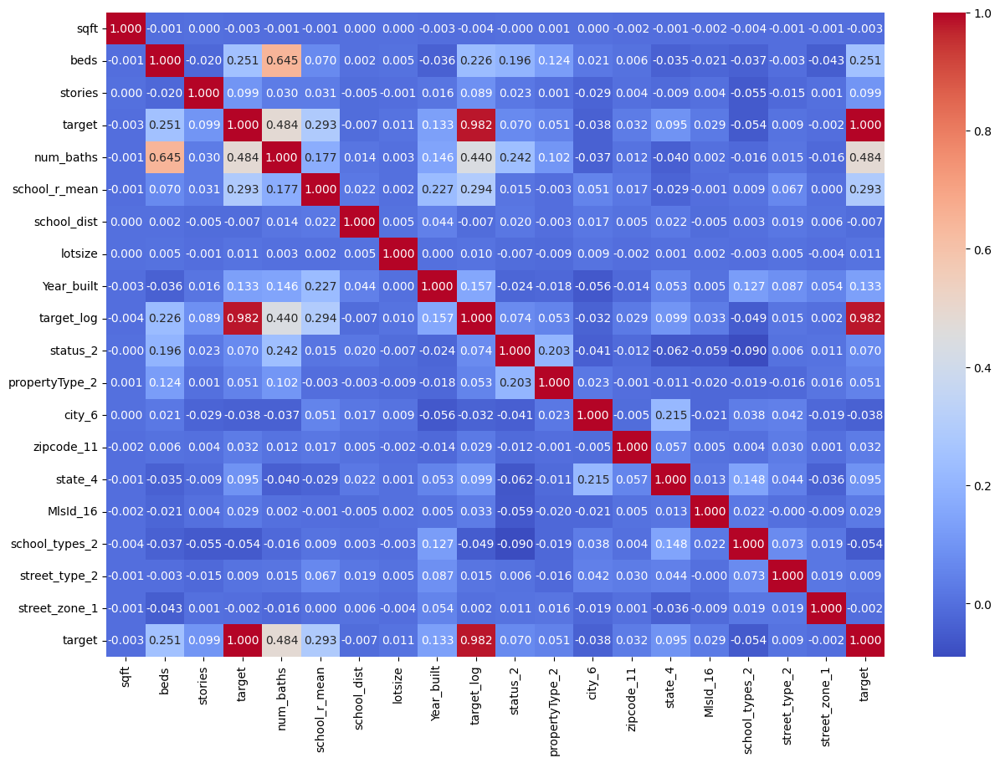

In [107]:
result_columns = []
for column in df:
    col_data = df[column]
    if col_data.min() < -0.8 or col_data.sort_values(ascending=False)[1] > 0.8:
        result_columns.append(column)
result_columns.append('target')
        
plt.rcParams['figure.figsize'] = (15,10)
sns.heatmap(df[result_columns].corr(), annot=True, cmap='coolwarm', fmt='.3f')

#### Вывод: Мы можем видеть, что сильной корреляции между признаками не наблюдается

### Разобьём данные на тренировочную и тестовую выборки 


In [108]:
# # оставим только 12 признаков 
# df = df[['sqft',
#     'target',
#     'target_log',
#     'beds',
#     'stories',
#     'num_baths',
#     'additional_bath',
#     'school_r_mean', 
#     'school_dist',
#     'Year_built',
#     'Heating',
#     'Cooling',
#     'Parking',
#     'lotsize']]

In [109]:

X = df.drop(['target', 'target_log'], axis=1)
y = df['target']
y_log = df['target_log']
# Воспользуемся специальной функцией train_test_split для разбивки тренировочных и тестовых данных 
X_train, X_test, y_train_log, y_test_log = train_test_split(X, y_log, random_state = 42, test_size = 0.33)

In [110]:
# Размер тестовой выборки
display(X_train.shape)
display(X_test.shape) 

(205629, 73)

(101280, 73)

In [111]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 306909 entries, 0 to 377184
Data columns (total 75 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   sqft             306909 non-null  int64  
 1   beds             306909 non-null  int64  
 2   stories          306909 non-null  float64
 3   target           306909 non-null  float64
 4   num_baths        306909 non-null  int64  
 5   additional_bath  306909 non-null  float64
 6   school_r_mean    306909 non-null  float64
 7   school_dist      306909 non-null  float64
 8   Heating          306909 non-null  int64  
 9   Cooling          306909 non-null  int64  
 10  Parking          306909 non-null  int64  
 11  lotsize          306909 non-null  float64
 12  Year_built       306909 non-null  int64  
 13  target_log       306909 non-null  float64
 14  status_0         306909 non-null  int64  
 15  status_1         306909 non-null  int64  
 16  status_2         306909 non-null  int64  
 

### Произведём отбор признаков с помощью SelectKBest и посмотрим на наиболее значимые признаки. Используем параметр score_func = f_regression. Оставим 50 признаков.

In [112]:
# Отбор признаков с помощью SelectKBest
selector = SelectKBest(
    score_func = f_regression,
    k = 50
)
selector.fit(X_train, y_train_log)

# Получение индексов выбранных признаков
best_features = selector.get_feature_names_out()
X_train = X_train[best_features]
X_test = X_test[best_features]

print('Признаки, которые вошли в список отобранных:', best_features)

Признаки, которые вошли в список отобранных: ['beds' 'stories' 'num_baths' 'school_r_mean' 'Heating' 'Cooling'
 'Parking' 'Year_built' 'status_1' 'status_2' 'status_3' 'propertyType_0'
 'propertyType_1' 'propertyType_2' 'city_0' 'city_1' 'city_2' 'city_3'
 'city_4' 'city_5' 'city_6' 'zipcode_1' 'zipcode_2' 'zipcode_4'
 'zipcode_6' 'zipcode_8' 'zipcode_11' 'state_1' 'state_2' 'state_3'
 'state_4' 'state_5' 'MlsId_1' 'MlsId_2' 'MlsId_3' 'MlsId_5' 'MlsId_6'
 'MlsId_7' 'MlsId_8' 'MlsId_9' 'MlsId_11' 'MlsId_12' 'MlsId_13' 'MlsId_14'
 'MlsId_15' 'MlsId_16' 'MlsId_17' 'school_types_0' 'school_types_1'
 'school_types_2']


In [113]:
# Получение оценок важности признаков
feature_scores = selector.scores_

# Создание словаря, где ключами будут названия признаков, а значениями их оценки важности
feature_score_dict = {feature_name: score for feature_name, score in zip(best_features, feature_scores)}

# Сортировка словаря по значениям (оценкам важности) в порядке убывания
sorted_feature_score_dict = dict(sorted(feature_score_dict.items(), key=lambda item: item[1], reverse=True))

# Вывод признаков по важности в порядке убывания
print("Признаки по важности в порядке убывания:")
for feature_name, score in sorted_feature_score_dict.items():
    print(f"{feature_name}: {score}")

Признаки по важности в порядке убывания:
school_r_mean: 50132.58113575621
Cooling: 19478.91382716665
stories: 11163.463271650062
MlsId_11: 10486.792090513092
MlsId_13: 5973.229171103852
propertyType_2: 5786.475871289655
propertyType_0: 5091.502584546862
city_2: 4170.510401167615
city_6: 3491.9943549401987
MlsId_12: 2503.1403633527643
num_baths: 2108.3851461551035
MlsId_14: 2091.661789608901
city_3: 1532.0765896871767
Year_built: 1432.3279467824311
MlsId_15: 1411.8477241967448
zipcode_4: 1236.1642623229577
city_0: 1123.5820164590505
status_1: 1096.063640924544
status_2: 870.0806939222743
zipcode_1: 859.3414443576726
city_1: 712.5831002759222
city_4: 559.7461130268842
state_1: 515.7681876132648
MlsId_3: 305.2079365461091
zipcode_2: 292.8758575335951
city_5: 272.0030199832231
zipcode_6: 227.26555480511428
zipcode_8: 225.26976529040394
state_2: 206.9478230153564
school_types_1: 188.86531521186572
MlsId_7: 188.60505472852617
state_4: 175.4327182477627
MlsId_1: 171.36219771593545
MlsId_17: 1

In [114]:
X_train.shape[1]
X_test.shape[1]

50

### Стандартизируем числовые признаки с помощью StandardScaler()

In [115]:
# Применяем стандартизацию
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

#### 

In [116]:
df.head()

,sqft,beds,stories,target,num_baths,additional_bath,school_r_mean,school_dist,Heating,Cooling,...,school_types_0,school_types_1,school_types_2,street_type_0,street_type_1,street_type_2,street_type_3,street_zone_0,street_zone_1,street_zone_2
0,2900,4,2.0,24.976296,3,0.50,5.0,2.70,1,0,...,0,0,1,0,0,0,1,0,0,1
1,1947,3,2.0,24.000647,3,0.25,4.0,1.01,0,0,...,0,0,1,0,0,1,0,0,1,0
2,3000,3,1.0,31.989488,2,0.25,7.0,1.19,1,1,...,0,1,0,0,0,1,1,0,1,1
3,6457,5,3.0,31.245623,8,0.25,9.0,0.10,1,1,...,0,0,1,0,0,1,0,0,1,0
5,897,2,2.0,22.754395,2,0.25,-1.0,-1.00,1,1,...,0,1,1,0,1,0,0,1,0,0


In [117]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 306909 entries, 0 to 377184
Data columns (total 75 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   sqft             306909 non-null  int64  
 1   beds             306909 non-null  int64  
 2   stories          306909 non-null  float64
 3   target           306909 non-null  float64
 4   num_baths        306909 non-null  int64  
 5   additional_bath  306909 non-null  float64
 6   school_r_mean    306909 non-null  float64
 7   school_dist      306909 non-null  float64
 8   Heating          306909 non-null  int64  
 9   Cooling          306909 non-null  int64  
 10  Parking          306909 non-null  int64  
 11  lotsize          306909 non-null  float64
 12  Year_built       306909 non-null  int64  
 13  target_log       306909 non-null  float64
 14  status_0         306909 non-null  int64  
 15  status_1         306909 non-null  int64  
 16  status_2         306909 non-null  int64  
 

### Решение задачи регрессии 

### Ко всем моделям будем применять экспоненту, для корректного вывода результатов 

### Линейная регрессия 

In [118]:
linear_model = LinearRegression()
# Обучаем нашу модель
linear_model.fit(X_train_scaled, y_train_log)
# Делаем предсказание 
y_train_pred = linear_model.predict(X_train_scaled)
y_test_pred = linear_model.predict(X_test_scaled)


In [119]:
# Применяем экспоненту к предсказаниям для корректного вывода 
y_train_pred_original_scale = np.exp(y_train_pred)
y_test_pred_original_scale = np.exp(y_test_pred)

In [120]:
# Выводим метрики для трейна 
print(f'Train R2 score: {r2_score(np.exp(y_train_log), y_train_pred_original_scale):.2f}')
print(f'Train MAE score: {mean_absolute_error(np.exp(y_train_log), y_train_pred_original_scale):.2f}')
print(f'Train MSE score: {mean_squared_error(np.exp(y_train_log), y_train_pred_original_scale):.2f}')
print(f'Train MAPE score: {mean_absolute_percentage_error(np.exp(y_train_log), y_train_pred_original_scale) * 100:.2f}%')
print(f'Train RMSLE score: {np.sqrt(mean_squared_error(np.exp(y_train_log), y_train_pred_original_scale)):.2f}')

print('\n')
# выводим тоже самое на тесте
print(f'Test R2 score: {r2_score(np.exp(y_test_log), y_test_pred_original_scale):.2f}')
print(f'Test MAE score: {mean_absolute_error(np.exp(y_test_log), y_test_pred_original_scale):.2f}')
print(f'Test MAPE score: {mean_absolute_percentage_error(np.exp(y_test_log), y_test_pred_original_scale) * 100:.2f}%')
print(f'Test MSE score: {mean_squared_error(np.exp(y_test_log), y_test_pred_original_scale):.2f}')
print(f'Test RMSLE score: {np.sqrt(mean_squared_error(np.exp(y_test_log), y_test_pred_original_scale)):.2f}')

Train R2 score: 0.31
Train MAE score: 1.79
Train MSE score: 7.64
Train MAPE score: 7.17%
Train RMSLE score: 2.76


Test R2 score: 0.30
Test MAE score: 1.79
Test MAPE score: 7.21%
Test MSE score: 7.77
Test RMSLE score: 2.79


#### Как мы видим, результат вполне себе нормальный, только R2 не очень, попробуем  улучшить эту метрику с помощью полиномиальных признаков

In [121]:

poly = PolynomialFeatures(include_bias=False) # degree=2 по-умолчанию
poly.fit(X_train_scaled)

X_train_poly = poly.transform(X_train_scaled)
#Генерируем полиномиальные признаки для тестовой выборки
X_test_poly = poly.transform(X_test_scaled)

In [122]:
#Создаём объект класса LinearRegression
reg_poly = LinearRegression()
#Обучаем модель 
reg_poly.fit(X_train_poly, y_train_log)
#Делаем предсказание для тренировочной выборки
y_train_predict_poly = reg_poly.predict(X_train_poly)
#Делаем предсказание для тестовой выборки
y_test_predict_poly = reg_poly.predict(X_test_poly)

In [123]:
# Применяем экспоненту к предсказаниям для корректного вывода 
y_train_pred_original_poly = np.exp(y_train_predict_poly)
y_test_pred_original_poly = np.exp(y_test_predict_poly)

In [124]:
# Выводим метрики для трейна 
print(f'Train R2 score: {r2_score(np.exp(y_train_log), y_train_pred_original_poly):.2f}')
print(f'Train MAE score: {mean_absolute_error(np.exp(y_train_log), y_train_pred_original_poly):.2f}')
print(f'Train MSE score: {mean_squared_error(np.exp(y_train_log), y_train_pred_original_poly):.2f}')
print(f'Train MAPE score: {mean_absolute_percentage_error(np.exp(y_train_log), y_train_pred_original_poly) * 100:.2f}%')
print(f'Train RMSLE score: {np.sqrt(mean_squared_error(np.exp(y_train_log), y_train_pred_original_poly)):.2f}')

print('\n')
# выводим тоже самое на тесте
print(f'Test R2 score: {r2_score(np.exp(y_test_log), y_test_pred_original_poly):.2f}')
print(f'Test MAE score: {mean_absolute_error(np.exp(y_test_log), y_test_pred_original_poly):.2f}')
print(f'Test MAPE score: {mean_absolute_percentage_error(np.exp(y_test_log), y_test_pred_original_poly) * 100:.2f}%')
print(f'Test MSE score: {mean_squared_error(np.exp(y_test_log), y_test_pred_original_poly):.2f}')
print(f'Test RMSLE score: {np.sqrt(mean_squared_error(np.exp(y_test_log), y_test_pred_original_poly)):.2f}')

Train R2 score: 0.62
Train MAE score: 1.45
Train MSE score: 4.20
Train MAPE score: 5.76%
Train RMSLE score: 2.05


Test R2 score: 0.61
Test MAE score: 1.46
Test MAPE score: 5.84%
Test MSE score: 4.30
Test RMSLE score: 2.07


#### Как мы видим показатели улучшились, Попробуем воспользоваться регуляризацией чтобы снизить переобучение и посмотрим что у нас получится 

In [125]:

# Создаем объект класса Ridge с заданным параметром alpha (коэффициент регуляризации)
ridge_reg = Ridge(alpha=0.2)  # берём значение alpha=0.2

# Обучаем модель с регуляризацией Ridge на полиномиальных признаках
ridge_reg.fit(X_train_poly, y_train_log)

# Делаем предсказания для тренировочной и тестовой выборок
y_train_predict_ridge = ridge_reg.predict(X_train_poly)
y_test_predict_ridge = ridge_reg.predict(X_test_poly)


In [126]:
# Применяем экспоненту к предсказаниям для корректного вывода 
y_train_poly_ridge = np.exp(y_train_predict_ridge)
y_test_poly_ridge = np.exp(y_test_predict_ridge)

In [127]:
# Выводим метрики для трейна 
print(f'Train R2 score: {r2_score(np.exp(y_train_log), y_train_poly_ridge):.2f}')
print(f'Train MAE score: {mean_absolute_error(np.exp(y_train_log), y_train_poly_ridge):.2f}')
print(f'Train MSE score: {mean_squared_error(np.exp(y_train_log), y_train_poly_ridge):.2f}')
print(f'Train MAPE score: {mean_absolute_percentage_error(np.exp(y_train_log), y_train_poly_ridge) * 100:.2f}%')
print(f'Train RMSLE score: {np.sqrt(mean_squared_error(np.exp(y_train_log), y_train_poly_ridge)):.2f}')

print('\n')
# выводим тоже самое на тесте
print(f'Test R2 score: {r2_score(np.exp(y_test_log), y_test_poly_ridge):.2f}')
print(f'Test MAE score: {mean_absolute_error(np.exp(y_test_log), y_test_poly_ridge):.2f}')
print(f'Test MAPE score: {mean_absolute_percentage_error(np.exp(y_test_log), y_test_poly_ridge) * 100:.2f}%')
print(f'Test MSE score: {mean_squared_error(np.exp(y_test_log), y_test_poly_ridge):.2f}')
print(f'Test RMSLE score: {np.sqrt(mean_squared_error(np.exp(y_test_log), y_test_poly_ridge)):.2f}')

Train R2 score: 0.62
Train MAE score: 1.45
Train MSE score: 4.20
Train MAPE score: 5.76%
Train RMSLE score: 2.05


Test R2 score: 0.61
Test MAE score: 1.46
Test MAPE score: 5.84%
Test MSE score: 4.30
Test RMSLE score: 2.07


####  Как мы видим, регуляризация особо не улучшила результаты 

#### Вывод: Линейная регрессия показала неплохие результаты 

### Воспользуемся RandomForestRegressor на полиномиальных признаках 

In [128]:
#Создаем объект класса случайный лес
rf = RandomForestRegressor(
    n_estimators=200,
    max_depth=12,
    min_samples_leaf= 5,
    random_state=42,
    n_jobs=-1
)
#Обучаем модель
rf.fit(X_train_scaled, y_train_log)
#Делаем предикт 
y_train_pred_rf = rf.predict(X_train_scaled)
y_test_pred_rf = rf.predict(X_test_scaled)



In [129]:
# Применяем экспоненту к предсказаниям для корректного вывода 
y_train_exp_rf = np.exp(y_train_pred_rf)
y_test_exp_rf= np.exp(y_test_pred_rf)

In [130]:
# Выводим метрики для трейна 
print(f'Train R2 score: {r2_score(np.exp(y_train_log), y_train_exp_rf):.2f}')
print(f'Train MAE score: {mean_absolute_error(np.exp(y_train_log), y_train_exp_rf):.2f}')
print(f'Train MSE score: {mean_squared_error(np.exp(y_train_log), y_train_exp_rf):.2f}')
print(f'Train MAPE score: {mean_absolute_percentage_error(np.exp(y_train_log), y_train_exp_rf) * 100:.2f}%')
print(f'Train RMSLE score: {np.sqrt(mean_squared_error(np.exp(y_train_log), y_train_exp_rf)):.2f}')

print('\n')
# выводим тоже самое на тесте
print(f'Test R2 score: {r2_score(np.exp(y_test_log), y_test_exp_rf):.2f}')
print(f'Test MAE score: {mean_absolute_error(np.exp(y_test_log), y_test_exp_rf):.2f}')
print(f'Test MAPE score: {mean_absolute_percentage_error(np.exp(y_test_log), y_test_exp_rf) * 100:.2f}%')
print(f'Test MSE score: {mean_squared_error(np.exp(y_test_log), y_test_exp_rf):.2f}')
print(f'Test RMSLE score: {np.sqrt(mean_squared_error(np.exp(y_test_log), y_test_exp_rf)):.2f}')

Train R2 score: 0.70
Train MAE score: 1.28
Train MSE score: 3.36
Train MAPE score: 5.09%
Train RMSLE score: 1.83


Test R2 score: 0.67
Test MAE score: 1.34
Test MAPE score: 5.36%
Test MSE score: 3.66
Test RMSLE score: 1.91


#### Вывод: Как мы видим результаты улучшились, что уже довольно неплохо

### Создаем модель градиентного бустинга


In [131]:
gb_boost  = GradientBoostingRegressor(
    learning_rate=0.5, # темп обучения
    n_estimators=300, # число деревьев
    max_depth=6,# максимальная глубина 
    min_samples_split=30, # Минимальное количество образцов
    random_state=42 # генератор случайных чисел
    
)
# Обучаем модель 
gb_boost.fit(X_train_scaled, y_train_log)
# Делаем предикт 
y_train_pred_boost = gb_boost.predict(X_train_scaled)
y_test_pred_boost= gb_boost.predict(X_test_scaled)


In [132]:
# Применяем экспоненту к предсказаниям для корректного вывода 
y_train_exp_gb = np.exp(y_train_pred_boost)
y_test_exp_gb= np.exp(y_test_pred_boost)

In [133]:
# Выводим метрики для трейна 
print(f'Train R2 score: {r2_score(np.exp(y_train_log), y_train_exp_gb):.2f}')
print(f'Train MAE score: {mean_absolute_error(np.exp(y_train_log), y_train_exp_gb):.2f}')
print(f'Train MSE score: {mean_squared_error(np.exp(y_train_log), y_train_exp_gb):.2f}')
print(f'Train MAPE score: {mean_absolute_percentage_error(np.exp(y_train_log), y_train_exp_gb) * 100:.2f}%')
print(f'Train RMSLE score: {np.sqrt(mean_squared_error(np.exp(y_train_log), y_train_exp_gb)):.2f}')

print('\n')
# выводим тоже самое на тесте
print(f'Test R2 score: {r2_score(np.exp(y_test_log), y_test_exp_gb):.2f}')
print(f'Test MAE score: {mean_absolute_error(np.exp(y_test_log), y_test_exp_gb):.2f}')
print(f'Test MAPE score: {mean_absolute_percentage_error(np.exp(y_test_log), y_test_exp_gb) * 100:.2f}%')
print(f'Test MSE score: {mean_squared_error(np.exp(y_test_log), y_test_exp_gb):.2f}')
print(f'Test RMSLE score: {np.sqrt(mean_squared_error(np.exp(y_test_log), y_test_exp_gb)):.2f}')

Train R2 score: 0.81
Train MAE score: 1.01
Train MSE score: 2.11
Train MAPE score: 4.00%
Train RMSLE score: 1.45


Test R2 score: 0.74
Test MAE score: 1.16
Test MAPE score: 4.64%
Test MSE score: 2.84
Test RMSLE score: 1.68


####  Вывод: Модель показывает ещё лучшие результаты в сравнении с предыдущими 

### Теперь построим более сложную модель XGBRegressor из модуля XGBoost

In [134]:

# Реализация функции оптимизации гиперпараметров с помощью Optuna
def optuna_XGB(trial):
    # Задаем пространства поиска гиперпараметров
    max_depth = trial.suggest_int('max_depth', 2, 10)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 5)
    subsample = trial.suggest_float('subsample', 0.5, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.5, 1.0)
    learning_rate = trial.suggest_float('learning_rate', 0.01, 0.3)
    gamma = trial.suggest_float('gamma', 0.0, 0.5)

    # Создаем модель
    opt_model = xgb.XGBRegressor(
        max_depth=max_depth,
        min_child_weight=min_child_weight,
        colsample_bytree=colsample_bytree,
        subsample=subsample,
        learning_rate=learning_rate,
        gamma=gamma,
        random_state=42,
        objective='reg:squarederror')  # Указываем objective для регрессии

    # Обучаем модель
    opt_model.fit(X_train_scaled, y_train_log)
  
    # Воспользуемся метрикой MSE для поиска лучших гиперпараметров 
    y_pred_train = opt_model.predict(X_train_scaled)
    score = mean_squared_error(y_train_log, y_pred_train)

    return score

# Поиск оптимальных гиперпараметров
sampler = optuna.samplers.TPESampler(seed=42)
study = optuna.create_study(
    sampler=sampler, study_name='XGBRegressor', direction='minimize')  # Направление 'minimize' для минимизации MSE
study.optimize(optuna_XGB, n_trials=20)

print(f'Лучшие параметры:\n{study.best_params}')


[I 2024-04-24 01:42:22,240] A new study created in memory with name: XGBRegressor
[I 2024-04-24 01:42:22,867] Trial 0 finished with value: 0.006537580380979517 and parameters: {'max_depth': 5, 'min_child_weight': 5, 'subsample': 0.8659969709057025, 'colsample_bytree': 0.7993292420985183, 'learning_rate': 0.055245405728306586, 'gamma': 0.07799726016810132}. Best is trial 0 with value: 0.006537580380979517.
[I 2024-04-24 01:42:23,249] Trial 1 finished with value: 0.012479276928091657 and parameters: {'max_depth': 2, 'min_child_weight': 5, 'subsample': 0.8005575058716043, 'colsample_bytree': 0.8540362888980227, 'learning_rate': 0.01596950334578271, 'gamma': 0.48495492608099716}. Best is trial 0 with value: 0.006537580380979517.
[I 2024-04-24 01:42:23,940] Trial 2 finished with value: 0.00556843682639361 and parameters: {'max_depth': 9, 'min_child_weight': 2, 'subsample': 0.5909124836035503, 'colsample_bytree': 0.5917022549267169, 'learning_rate': 0.09823025045826593, 'gamma': 0.2623782158

Лучшие параметры:
{'max_depth': 10, 'min_child_weight': 3, 'subsample': 0.7039593671079456, 'colsample_bytree': 0.6838472792775279, 'learning_rate': 0.21006822277141063, 'gamma': 0.0021088957454742452}


#### Небольшой ликбез: Модель xgb.XGBRegressor может включать в себя модель стохастического градиентного бустинга 
#### Если параметры subsample и colsample_bytree меньше 1. XGBoost использует стохастический градиентный бустинг

In [135]:
xgb_boost  = xgb.XGBRegressor(
    learning_rate=0.21, # темп обучения
    max_depth=10, # Максимальная глубина каждого дерева
    min_child_weight=3, # Минимальное количество объектов в листовой вершине
    gamma=0.0021, # Минимальное уменьшение функции потерь, необходимое для разделения дерева
    colsample_bytree=0.68, # Доля признаков, используемых при построении каждого дерева
    subsample=0.7, # Доля обучающих данных, используемых для обучения каждого дерева
    random_state=42 # генератор случайных чисел
    
)

xgb_boost.fit(X_train_scaled, y_train_log)
y_train_pred_xgb = xgb_boost.predict(X_train_scaled)
y_test_pred_xgb= xgb_boost.predict(X_test_scaled)

In [136]:
# Применяем экспоненту к предсказаниям для корректного вывода 
y_train_exp_xgb = np.exp(y_train_pred_xgb)
y_test_exp_xgb= np.exp(y_test_pred_xgb)

In [137]:
# Выводим метрики для трейна 
print(f'Train R2 score: {r2_score(np.exp(y_train_log), y_train_exp_xgb):.2f}')
print(f'Train MAE score: {mean_absolute_error(np.exp(y_train_log), y_train_exp_xgb):.2f}')
print(f'Train MSE score: {mean_squared_error(np.exp(y_train_log), y_train_exp_xgb):.2f}')
print(f'Train MAPE score: {mean_absolute_percentage_error(np.exp(y_train_log), y_train_exp_xgb) * 100:.2f}%')
print(f'Train RMSLE score: {np.sqrt(mean_squared_error(np.exp(y_train_log), y_train_exp_xgb)):.2f}')

print('\n')
# выводим тоже самое на тесте
print(f'Test R2 score: {r2_score(np.exp(y_test_log), y_test_exp_xgb):.2f}')
print(f'Test MAE score: {mean_absolute_error(np.exp(y_test_log), y_test_exp_xgb):.2f}')
print(f'Test MAPE score: {mean_absolute_percentage_error(np.exp(y_test_log), y_test_exp_xgb) * 100:.2f}%')
print(f'Test MSE score: {mean_squared_error(np.exp(y_test_log), y_test_exp_xgb):.2f}')
print(f'Test RMSLE score: {np.sqrt(mean_squared_error(np.exp(y_test_log), y_test_exp_xgb)):.2f}')

Train R2 score: 0.86
Train MAE score: 0.85
Train MSE score: 1.52
Train MAPE score: 3.36%
Train RMSLE score: 1.23


Test R2 score: 0.76
Test MAE score: 1.11
Test MAPE score: 4.43%
Test MSE score: 2.62
Test RMSLE score: 1.62


#### Вывод: Мы видим что показатели стали ещё лучше, засчёт подобранных гиперпараметров 

### Применем модель CatBoost

#### Для начала подберём наилучшие гиперпараметры 

In [138]:
def cat_reg(trial):
    params = {
        "iterations": 1000,
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.1, log=True),
        "depth": trial.suggest_int("depth", 1, 10),
        "subsample": trial.suggest_float("subsample", 0.05, 1.0),
        "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.05, 1.0),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 1, 100),
    }
    
    opt_model = catboost.CatBoostRegressor(**params, random_state=42, silent=True)
    # Обучаем модель 
    opt_model.fit(X_train_scaled, y_train_log)
    # Воспользуемся метрикой MSE для поиска лучших гиперпараметров 
    y_pred_train = opt_model.predict(X_train_scaled)
    score = mean_squared_error(y_train_log, y_pred_train, squared=False)

    return score
    
    
# Поиск оптимальных гиперпараметров
sampler = optuna.samplers.TPESampler(seed=42)
study = optuna.create_study(
    sampler=sampler, study_name='CatBoostRegressor', direction='minimize')  # Направление 'minimize' для минимизации MSE
study.optimize(cat_reg, n_trials=30)

print(f'Лучшие параметры:\n{study.best_params}')

[I 2024-04-24 01:42:37,455] A new study created in memory with name: CatBoostRegressor
[I 2024-04-24 01:42:55,660] Trial 0 finished with value: 0.0740029315667911 and parameters: {'learning_rate': 0.005611516415334507, 'depth': 10, 'subsample': 0.7453942447208348, 'colsample_bylevel': 0.6187255599871848, 'min_data_in_leaf': 16}. Best is trial 0 with value: 0.0740029315667911.
[I 2024-04-24 01:42:58,348] Trial 1 finished with value: 0.11711284763495039 and parameters: {'learning_rate': 0.002051110418843397, 'depth': 1, 'subsample': 0.8728673384861885, 'colsample_bylevel': 0.6210592611560484, 'min_data_in_leaf': 71}. Best is trial 0 with value: 0.0740029315667911.
[I 2024-04-24 01:43:15,840] Trial 2 finished with value: 0.09596261440788258 and parameters: {'learning_rate': 0.0010994335574766201, 'depth': 10, 'subsample': 0.8408205087604007, 'colsample_bylevel': 0.25172215514436236, 'min_data_in_leaf': 19}. Best is trial 0 with value: 0.0740029315667911.
[I 2024-04-24 01:43:20,389] Trial 

Лучшие параметры:
{'learning_rate': 0.09820052512874733, 'depth': 9, 'subsample': 0.4188849306647806, 'colsample_bylevel': 0.31111030154549957, 'min_data_in_leaf': 52}


In [139]:
cat = catboost.CatBoostRegressor(
    iterations=1000,
    learning_rate=0.1,
    depth=9,
    subsample=0.41,
    colsample_bylevel=0.31,
    min_data_in_leaf=52
    
)

# Обучаем модель 
cat.fit(X_train_scaled, y_train_log)
# Делаем предикт 
y_train_pred_cat = cat.predict(X_train_scaled)
y_test_pred_cat= cat.predict(X_test_scaled)

0:	learn: 0.1273812	total: 24.5ms	remaining: 24.5s
1:	learn: 0.1219802	total: 39ms	remaining: 19.4s
2:	learn: 0.1177259	total: 57.5ms	remaining: 19.1s
3:	learn: 0.1135996	total: 69.9ms	remaining: 17.4s
4:	learn: 0.1103932	total: 81.9ms	remaining: 16.3s
5:	learn: 0.1073116	total: 92.7ms	remaining: 15.4s
6:	learn: 0.1047973	total: 106ms	remaining: 15s
7:	learn: 0.1025179	total: 118ms	remaining: 14.6s
8:	learn: 0.1002426	total: 130ms	remaining: 14.3s
9:	learn: 0.0982998	total: 151ms	remaining: 14.9s
10:	learn: 0.0967997	total: 164ms	remaining: 14.7s
11:	learn: 0.0953483	total: 178ms	remaining: 14.6s
12:	learn: 0.0939743	total: 195ms	remaining: 14.8s
13:	learn: 0.0928281	total: 209ms	remaining: 14.8s
14:	learn: 0.0916394	total: 229ms	remaining: 15s
15:	learn: 0.0908892	total: 244ms	remaining: 15s
16:	learn: 0.0898500	total: 262ms	remaining: 15.1s
17:	learn: 0.0890927	total: 275ms	remaining: 15s
18:	learn: 0.0883871	total: 292ms	remaining: 15.1s
19:	learn: 0.0875114	total: 317ms	remaining: 

In [140]:
# Применяем экспоненту к предсказаниям для корректного вывода 
y_train_exp_cat = np.exp(y_train_pred_cat)
y_test_exp_cat= np.exp(y_test_pred_cat)

In [141]:
# Выводим метрики для трейна 
print(f'Train R2 score: {r2_score(np.exp(y_train_log), y_train_exp_cat):.2f}')
print(f'Train MAE score: {mean_absolute_error(np.exp(y_train_log), y_train_exp_cat):.2f}')
print(f'Train MSE score: {mean_squared_error(np.exp(y_train_log), y_train_exp_cat):.2f}')
print(f'Train MAPE score: {mean_absolute_percentage_error(np.exp(y_train_log), y_train_exp_cat) * 100:.2f}%')
print(f'Train RMSLE score: {np.sqrt(mean_squared_error(np.exp(y_train_log), y_train_exp_cat)):.2f}')

print('\n')
# выводим тоже самое на тесте
print(f'Test R2 score: {r2_score(np.exp(y_test_log), y_test_exp_cat):.2f}')
print(f'Test MAE score: {mean_absolute_error(np.exp(y_test_log), y_test_exp_cat):.2f}')
print(f'Test MAPE score: {mean_absolute_percentage_error(np.exp(y_test_log), y_test_exp_cat) * 100:.2f}%')
print(f'Test MSE score: {mean_squared_error(np.exp(y_test_log), y_test_exp_cat):.2f}')
print(f'Test RMSLE score: {np.sqrt(mean_squared_error(np.exp(y_test_log), y_test_exp_cat)):.2f}')

Train R2 score: 0.82
Train MAE score: 0.96
Train MSE score: 1.97
Train MAPE score: 3.79%
Train RMSLE score: 1.40


Test R2 score: 0.77
Test MAE score: 1.08
Test MAPE score: 4.34%
Test MSE score: 2.54
Test RMSLE score: 1.59


#### Вывод: Мы можем видеть как у нас улучшились данные, правда на мой взгляд не так чтобы прям сильно отличаются от XGBoost, потому что мы постарались убрать категориальные признаки и преобразовать их в числовые. 

### Теперь Построим модель Стекинга для наглядности, однако в продакшен не будем включать

In [142]:
# объединяем уже известные нам алгоритмы с помощью стекинга 
# Определение базовых моделей
base_models = [
    ('CatBoostRegressor', cat),
    ('linear_regression', reg_poly),
    ('gradient_boosting', xgb_boost)
]

# Создание стекинг классификатора с моделью линейной регрессии с полиномиальными признаками в качестве метамодели
stacking_model = StackingRegressor(
    estimators=base_models,
    final_estimator=reg_poly
)

# Обучение стекинг модели
stacking_model.fit(X_train_scaled, y_train_log)

# Предсказания для тренировочной и тестовой выборки
y_train_pred_stacking = stacking_model.predict(X_train_scaled)
y_test_pred_stacking = stacking_model.predict(X_test_scaled)



0:	learn: 0.1273812	total: 25.1ms	remaining: 25.1s
1:	learn: 0.1219802	total: 39.8ms	remaining: 19.9s
2:	learn: 0.1177259	total: 51.3ms	remaining: 17s
3:	learn: 0.1135996	total: 62.4ms	remaining: 15.5s
4:	learn: 0.1103932	total: 73.5ms	remaining: 14.6s
5:	learn: 0.1073116	total: 84.8ms	remaining: 14.1s
6:	learn: 0.1047973	total: 96ms	remaining: 13.6s
7:	learn: 0.1025179	total: 108ms	remaining: 13.4s
8:	learn: 0.1002426	total: 127ms	remaining: 13.9s
9:	learn: 0.0982998	total: 138ms	remaining: 13.7s
10:	learn: 0.0967997	total: 149ms	remaining: 13.4s
11:	learn: 0.0953483	total: 160ms	remaining: 13.2s
12:	learn: 0.0939743	total: 171ms	remaining: 13s
13:	learn: 0.0928281	total: 182ms	remaining: 12.8s
14:	learn: 0.0916394	total: 193ms	remaining: 12.7s
15:	learn: 0.0908892	total: 205ms	remaining: 12.6s
16:	learn: 0.0898500	total: 217ms	remaining: 12.5s
17:	learn: 0.0890927	total: 228ms	remaining: 12.4s
18:	learn: 0.0883871	total: 239ms	remaining: 12.3s
19:	learn: 0.0875114	total: 250ms	remain

In [143]:
# Применяем экспоненту к предсказаниям для корректного вывода 
y_train_exp_stacking = np.exp(y_train_pred_stacking)
y_test_exp_stacking= np.exp(y_test_pred_stacking)

In [144]:
# Выводим метрики для трейна 
print(f'Train R2 score: {r2_score(np.exp(y_train_log), y_train_exp_stacking):.2f}')
print(f'Train MAE score: {mean_absolute_error(np.exp(y_train_log), y_train_exp_stacking):.2f}')
print(f'Train MSE score: {mean_squared_error(np.exp(y_train_log), y_train_exp_stacking):.2f}')
print(f'Train MAPE score: {mean_absolute_percentage_error(np.exp(y_train_log), y_train_exp_stacking) * 100:.2f}%')
print(f'Train RMSLE score: {np.sqrt(mean_squared_error(np.exp(y_train_log), y_train_exp_stacking)):.2f}')

print('\n')
# выводим тоже самое на тесте
print(f'Test R2 score: {r2_score(np.exp(y_test_log), y_test_exp_stacking):.2f}')
print(f'Test MAE score: {mean_absolute_error(np.exp(y_test_log), y_test_exp_stacking):.2f}')
print(f'Test MAPE score: {mean_absolute_percentage_error(np.exp(y_test_log), y_test_exp_stacking) * 100:.2f}%')
print(f'Test MSE score: {mean_squared_error(np.exp(y_test_log), y_test_exp_stacking):.2f}')
print(f'Test RMSLE score: {np.sqrt(mean_squared_error(np.exp(y_test_log), y_test_exp_stacking)):.2f}')

Train R2 score: 0.84
Train MAE score: 0.90
Train MSE score: 1.72
Train MAPE score: 3.55%
Train RMSLE score: 1.31


Test R2 score: 0.78
Test MAE score: 1.07
Test MAPE score: 4.29%
Test MSE score: 2.48
Test RMSLE score: 1.57


#### Вывод: Как мы видим результаты ещё немного улучшились 

### Подготовка модели к продакшену 

#### Создадим пайплайн, а также и предикт для нашей целевой переменной

#### Сделаем предсказание для нашей целевой переменной, чтобы было проще интерпретировать,  в качестве модели возьмём CatBoostRegressor. Выводить будем в долларах 

In [145]:
# пробовал так, однако получается не точное предсказание, цена постоянно 1млн+ поэтому лучше передадим все признаки  
# отберём нужные признаки для лучшей интерпретируемости для нашего веб приложения 
# selected_features = ['sqft',
#                      'beds',
#                      'stories',
#                      'num_baths',
#                      'additional_bath',
#                      'school_r_mean',
#                      'school_dist',
#                      'Year built',
#                      'Heating',
#                      'Cooling',
#                      'lotsize',
#                      'Parking']
# X_filtered = df[selected_features]


# #  Для пайплайна создадим отдельные X_p, y_p_log
# X_p = X_filtered
# y_p_log = df['target_log']


# # Обратное преобразование логарифмов
# y_p = np.exp(y_p_log) - 1

# # Параметр лямбда, используемый в преобразовании Бокса-Кокса
# lambda_value = update_price[1]

# # Обратное преобразование Бокса-Кокса
# y_target = inv_boxcox(y_p, lambda_value)

# # Воспользуемся специальной функцией train_test_split для разбивки тренировочных и тестовых данных 
# X_train, X_test, y_train_log, y_test_log = train_test_split(X_p, y_target, random_state = 42, test_size = 0.33)

# # Создаём pipeline
# pipeline = Pipeline([
#     ('BinaryEncoder', enc),
#     ('scaler', scaler),
#     ('CatBoostRegressor', cat)
#  ])

# # Обучение пайплайна
# pipeline.fit(X_train, y_train_log)

# # Сделаем предсказание на тренировочной и тестовой выборке
# y_train_pred_log = pipeline.predict(X_train)
# y_test_pred_log = pipeline.predict(X_test)

# # Вывод предсказанных значений в долларах
# print("Предсказания для тренировочной выборки:", y_train_pred_log)
# print("Предсказания для тестовой выборки:", y_test_pred_log)

In [146]:

# Для пайплайна создадим отдельные X_p, y_p_log
X_p = df.drop(['target', 'target_log'], axis=1)
y_p_log = df['target_log']


# Обратное преобразование логарифмов
y_p = np.exp(y_p_log) - 1

# Параметр лямбда, используемый в преобразовании Бокса-Кокса
lambda_value = update_price[1]

# Обратное преобразование Бокса-Кокса
y_target = inv_boxcox(y_p, lambda_value)

# Воспользуемся специальной функцией train_test_split для разбивки тренировочных и тестовых данных 
X_train, X_test, y_train_log, y_test_log = train_test_split(X_p, y_target, random_state = 42, test_size = 0.33)



# Создаём pipeline
pipeline = Pipeline([
    ('BinaryEncoder', enc),
    ('scaler', scaler),
    ('selector', selector),
    ('CatBoostRegressor', cat)
])

# Обучение пайплайна
pipeline.fit(X_train, y_train_log)

# Сделаем предсказание на тренировочной и тестовой выборке
y_train_pred_log = pipeline.predict(X_train)
y_test_pred_log = pipeline.predict(X_test)

# Вывод предсказанных значений в долларах
print("Предсказания для тренировочной выборки:", y_train_pred_log)
print("Предсказания для тестовой выборки:", y_test_pred_log)




0:	learn: 1752599.5322645	total: 77.7ms	remaining: 1m 17s
1:	learn: 1697236.1399167	total: 99.2ms	remaining: 49.5s
2:	learn: 1665864.4922754	total: 110ms	remaining: 36.7s
3:	learn: 1619616.2328060	total: 121ms	remaining: 30.3s
4:	learn: 1573500.1187836	total: 133ms	remaining: 26.5s
5:	learn: 1538428.3318576	total: 144ms	remaining: 23.8s
6:	learn: 1505033.5623400	total: 155ms	remaining: 21.9s
7:	learn: 1467426.8627864	total: 165ms	remaining: 20.5s
8:	learn: 1436396.7690025	total: 177ms	remaining: 19.4s
9:	learn: 1414197.0139274	total: 187ms	remaining: 18.6s
10:	learn: 1390364.6874700	total: 199ms	remaining: 17.9s
11:	learn: 1368523.1468446	total: 210ms	remaining: 17.3s
12:	learn: 1347602.2417472	total: 221ms	remaining: 16.7s
13:	learn: 1328293.9466749	total: 232ms	remaining: 16.3s
14:	learn: 1308089.1731468	total: 243ms	remaining: 15.9s
15:	learn: 1294620.6113658	total: 254ms	remaining: 15.6s
16:	learn: 1280070.9637104	total: 264ms	remaining: 15.3s
17:	learn: 1270818.1193049	total: 275m

#### Вывод: использование пайплайна существенно сократило и ускорило наш код

### Теперь произведём сериализацию (перевода структуры данных в последовательность битов) и десериализацию (обратный процесс)

In [147]:
import joblib

In [148]:

# Сериализуем и записываем результат в файл
joblib.dump(pipeline, 'final_model_pipeline.joblib')
# загрузка из файла (десериализация)
pipeline_from_joblib = joblib.load('final_model_pipeline.joblib') 

# Сравниваем предсказания
all(pipeline.predict(X_test) == pipeline_from_joblib.predict(X_test))

True

In [149]:
pipeline_from_joblib

Pipeline(steps=[('BinaryEncoder', BinaryEncoder(cols=[], mapping=[])),
                ('scaler', StandardScaler()),
                ('selector',
                 SelectKBest(k=50,
                             score_func=<function f_regression at 0x2a2a43740>)),
                ('CatBoostRegressor',
                 <catboost.core.CatBoostRegressor object at 0x2dde8ebd0>)])

###  Заключение: Мы смогли обучить модель, улучшить её обобщающую способность, сделать некие предположения и выводы 
### Теперь загрузим нашу модель в Docker контейнер и воспользуемся FastAPI + streamlit для лучшего User-friendly интерфейса
